In [36]:
import os
import cv2
import math
import time
import json
import glob
import seaborn as sn
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm as tqdm
from tabulate import tabulate

In [37]:
Match_result_csv_path = '../csv_file/PBL_match_result_all_root.csv'
Match_result_csv = pd.read_csv(Match_result_csv_path)

show_csv = Match_result_csv[['image_name','tooth_side','stage','PBL_predict_tooth','PBL_value','PBL_stage','tooth_path']]

In [38]:
Match_result_csv.head()

,Unnamed: 0,image_name,tooth_side,stage,PBL_predict_tooth,PBL_value,PBL_stage,tooth_path,CEJ_points,Bone_level_points
0,0,NN_190619_104716_EA3E9,9M,1.0,9_L,9.71,1,NN_190619_104716_EA3E9_0.PNG,1,1
1,1,NN_190619_104716_EA3E9,9D,1.0,9_R,13.577,1,NN_190619_104716_EA3E9_0.PNG,1,1
2,2,NN_190619_104716_EA3E9,10M,3.0,10_L,29.8,2,NN_190619_104716_EA3E9_1.PNG,1,1
3,3,NN_190619_104716_EA3E9,10D,3.0,10_R,69.595,3,NN_190619_104716_EA3E9_1.PNG,1,1
4,4,NN_190619_104720_EA3E7,7D,1.0,7_L,29.866,2,NN_190619_104720_EA3E7_1.PNG,1,1


In [39]:
stage_set = list(set(Match_result_csv['stage']))
print(stage_set)
PBL_stage_set = list(set(Match_result_csv['PBL_stage']))
print(PBL_stage_set)

[0.0, 1.0, 2.0, 3.0]
[nan, '0', 'No_match', '1', '2', '-999', '3']


In [40]:
folder_path = '../'
o_image_folder = os.path.join(folder_path,'1_o_image')
o_image_path_list = glob.glob(o_image_folder+'/*.PNG')
o_image_path_list.sort()

s_image_folder = os.path.join(folder_path,'1_seg_image')
s_image_path_list = glob.glob(s_image_folder+'/*.PNG')
s_image_path_list.sort()

seg_image_folder = os.path.join(folder_path,'3_pattern_detection_result')
seg_image_point_path_list = glob.glob(seg_image_folder+'/*.PNG')
seg_image_point_path_list.sort()

seg_fill_image_folder = os.path.join(folder_path,'2_seg_img_with_cej')
seg_fill_image_point_path_list = glob.glob(seg_fill_image_folder+'/*.PNG')
seg_fill_image_point_path_list.sort()

#seg_image_folder = os.path.join(folder_path,'4_result_with_label')
seg_image_folder = os.path.join(folder_path,'3_pattern_detection_result')
seg_image_info_path_list = glob.glob(seg_image_folder+'/*.PNG')
seg_image_info_path_list.sort()

#all json
json_save_path = '../Data/labeljson/*/*/*.json'
json_file_list = glob.glob(json_save_path)
print(len(json_file_list))

print(len(o_image_path_list),len(seg_image_info_path_list),len(seg_image_point_path_list))

0
2511 7420 7420


In [54]:
## PBL_stage,CEJ_points,Bone_level_points should be string
target_case = {'image_name':None,'stage':2,'PBL_stage':'-999','CEJ_points':None,'Bone_level_points':None}

In [55]:
target_table = Match_result_csv
#target_table = target_table.loc[(target_table['PBL_stage'] != '3') & (target_table['PBL_stage'] != '-999') & (target_table['PBL_stage'] != 'No_match')]

for key in target_case:
    if target_case[key] != None:
        target_table = target_table.loc[(target_table[key] == target_case[key])]
        

In [56]:
target_table.head()

,Unnamed: 0,image_name,tooth_side,stage,PBL_predict_tooth,PBL_value,PBL_stage,tooth_path,CEJ_points,Bone_level_points
434,434,NN__191111_145402_2420C,29D,2.0,29_L,-999.0,-999,NN__191111_145402_2420C_0.PNG,1,0
436,436,NN__191111_145402_2420C,28D,2.0,28_L,-999.0,-999,NN__191111_145402_2420C_1.PNG,1,0
648,648,NN_100825_103912_C03821,22M,2.0,22_L,-999.0,-999,NN_100825_103912_C03821_0.PNG,0,0
687,687,NN_130305_104814_A3C1AA,3M,2.0,3_R,-999.0,-999,NN_130305_104814_A3C1AA_1.PNG,1,0
1968,1968,NN_090903_154103_C07484,14D,2.0,14_R,-999.0,-999,NN_090903_154103_C07484_2.PNG,1,0


41


0 : NN_090903_154103_C07484
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 1965 | 12M          |       1 | 12_L                |      10.237 |           1 | NN_090903_154103_C07484_0.PNG |
| 1966 | 12D          |       1 | 12_R                |       1.245 |           1 | NN_090903_154103_C07484_0.PNG |
| 1967 | 13M          |       1 | 13_L                |       4.79  |           1 | NN_090903_154103_C07484_1.PNG |
| 1968 | 14D          |       2 | 14_R                |    -999     |        -999 | NN_090903_154103_C07484_2.PNG |
| 1969 | 15M          |       2 | 15_L                |    -999     |        -999 | NN_090903_154103_C07484_3.PNG |
| 1970 | 15D          |       3 | 15_R      

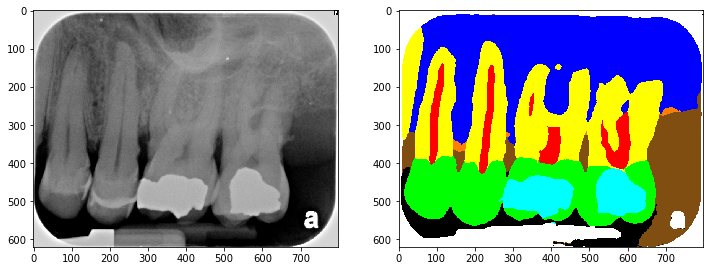

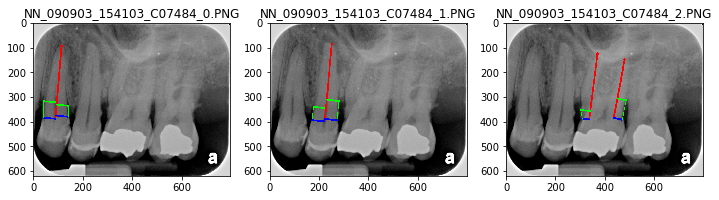

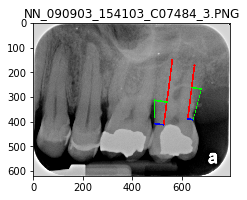

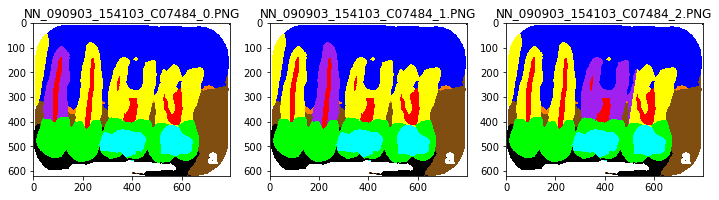

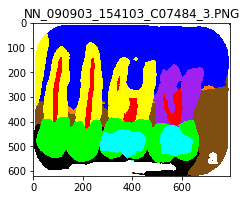

1 : NN_100825_103912_C03821
+-----+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|     | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|-----+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 648 | 22M          |       2 | 22_L                |        -999 |        -999 | NN_100825_103912_C03821_0.PNG |
+-----+--------------+---------+---------------------+-------------+-------------+-------------------------------+


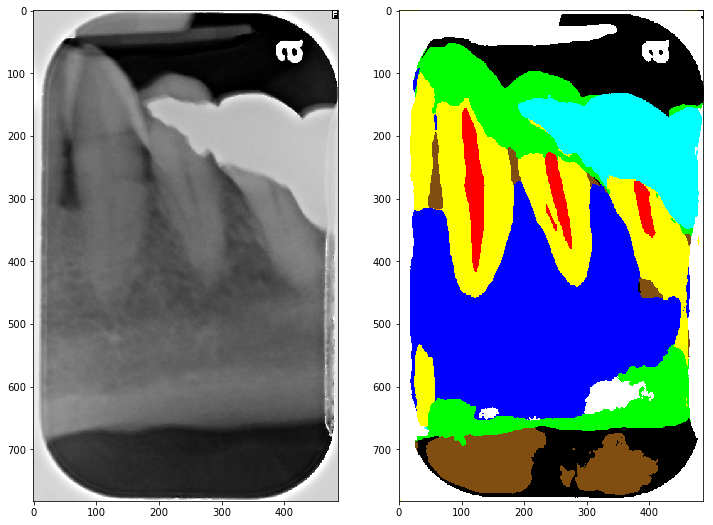

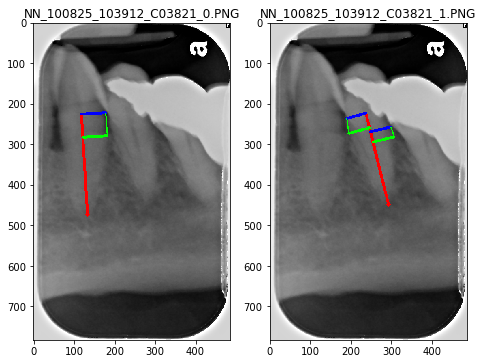

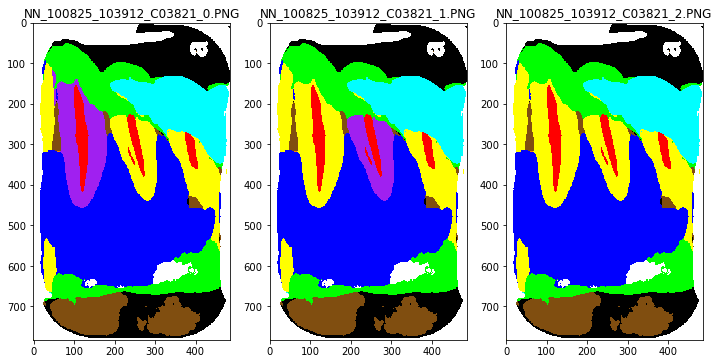

2 : NN_120823_103707_4AA71
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 2134 | 26D          |       2 | 26_L                |    -999     |        -999 | NN_120823_103707_4AA71_1.PNG |
| 2135 | 26M          |       2 | 26_R                |      32.448 |           2 | NN_120823_103707_4AA71_1.PNG |
| 2136 | 25D          |       2 | 25_L                |      32.653 |           2 | NN_120823_103707_4AA71_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+


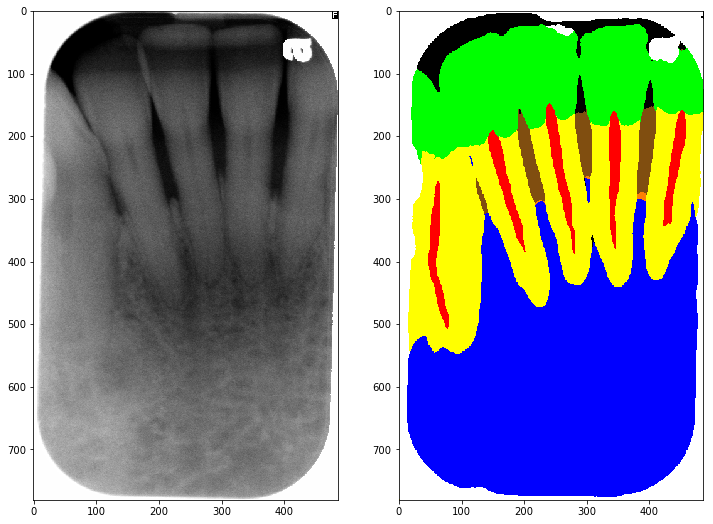

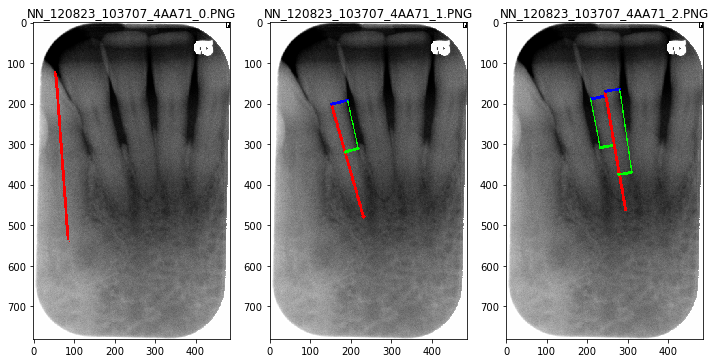

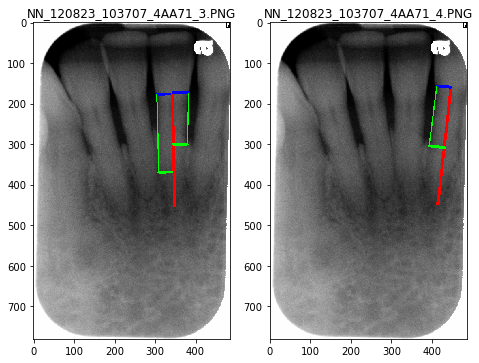

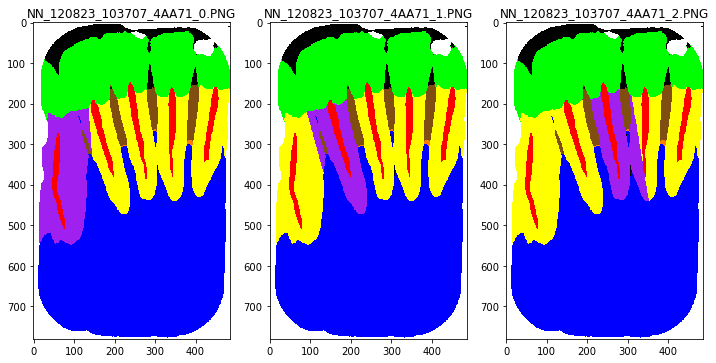

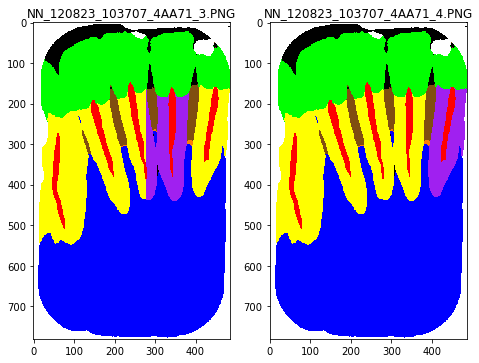

3 : NN_120910_140752_C0A7FA
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3566 | 23D          |       3 | No_match            | No_match    | No_match    | No_match                      |
| 3567 | 22M          |       2 | 22_L                | -999.0      | -999        | NN_120910_140752_C0A7FA_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


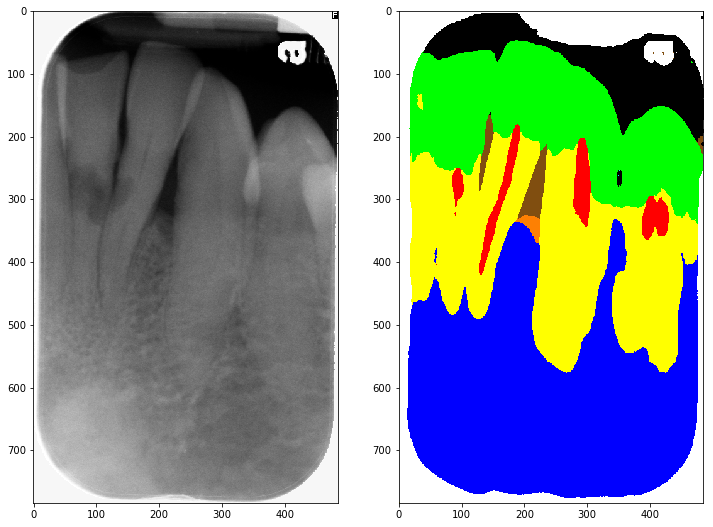

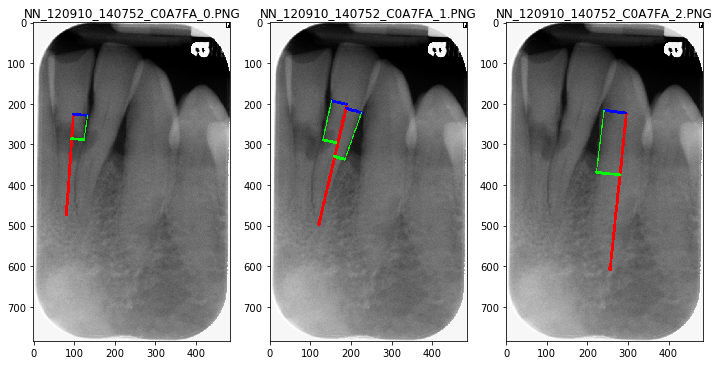

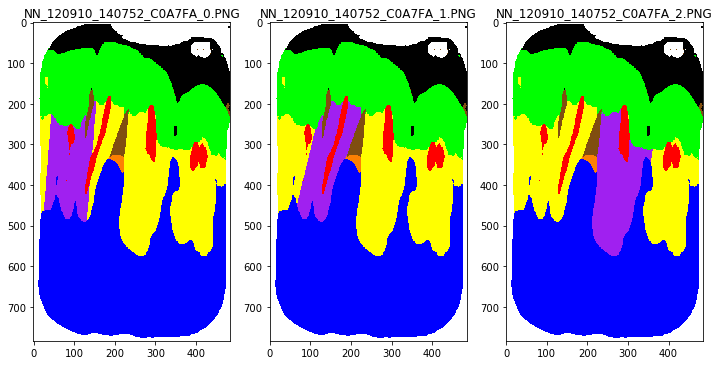

4 : NN_120910_140801_C0A803
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3571 | 3D           |       3 | 3_L                 |      31.143 |           2 | NN_120910_140801_C0A803_1.PNG |
| 3572 | 3M           |       3 | 3_R                 |      32.73  |           2 | NN_120910_140801_C0A803_1.PNG |
| 3573 | 4D           |       2 | 4_L                 |    -999     |        -999 | NN_120910_140801_C0A803_2.PNG |
| 3574 | 4M           |       1 | 4_R                 |       9.017 |           1 | NN_120910_140801_C0A803_2.PNG |
| 3575 | 5D           |       1 | 5_L                 |      10.245 |           1 | NN_120910_140801_C0A803_3.PNG |
| 3576 | 5M           |       1 | 5_R       

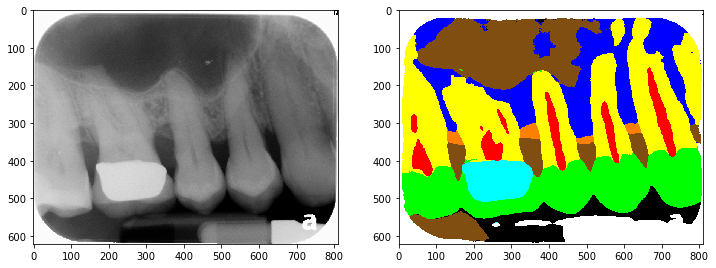

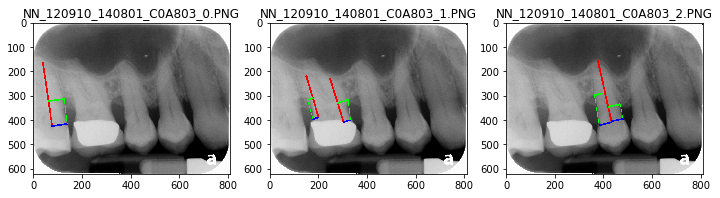

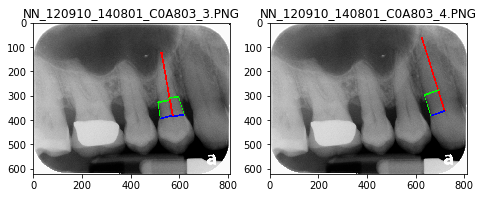

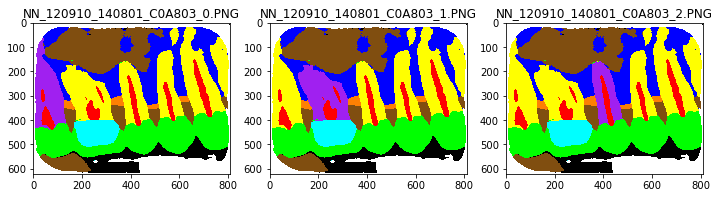

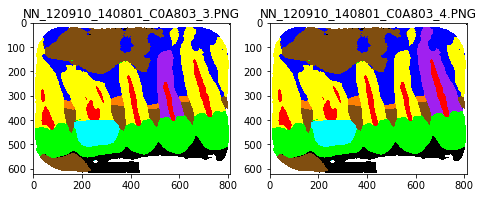

5 : NN_121003_145112_15C76A
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3186 | 31D          |       2 | 31_L                |    -999     |        -999 | NN_121003_145112_15C76A_0.PNG |
| 3187 | 31M          |       2 | 31_R                |      20.241 |           2 | NN_121003_145112_15C76A_0.PNG |
| 3188 | 30D          |       2 | 30_L                |      34.854 |           3 | NN_121003_145112_15C76A_1.PNG |
| 3189 | 30M          |       1 | 30_R                |      12.352 |           1 | NN_121003_145112_15C76A_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


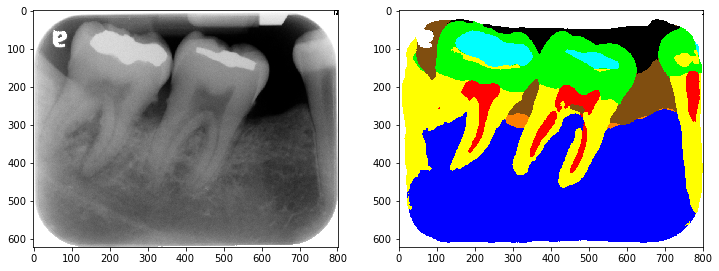

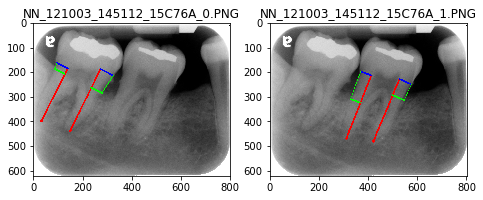

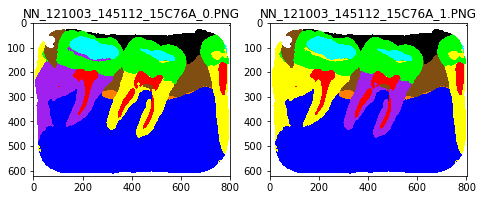

6 : NN_130305_104814_A3C1AA
+-----+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|     | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|-----+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 685 | 2M           |       2 | 2_R                 |       5.929 |           1 | NN_130305_104814_A3C1AA_0.PNG |
| 686 | 3D           |       2 | 3_L                 |       3.233 |           1 | NN_130305_104814_A3C1AA_1.PNG |
| 687 | 3M           |       2 | 3_R                 |    -999     |        -999 | NN_130305_104814_A3C1AA_1.PNG |
+-----+--------------+---------+---------------------+-------------+-------------+-------------------------------+


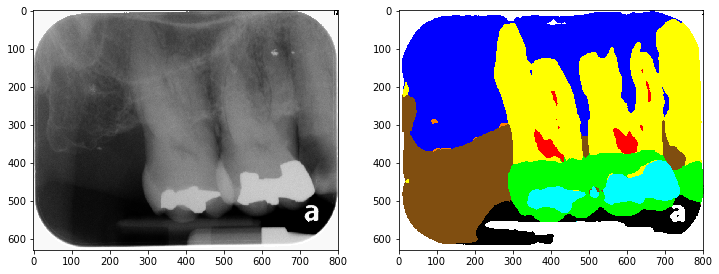

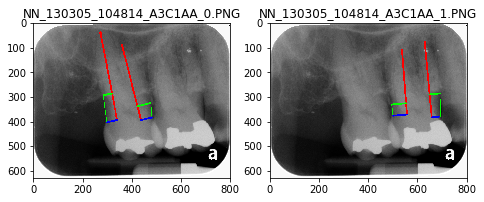

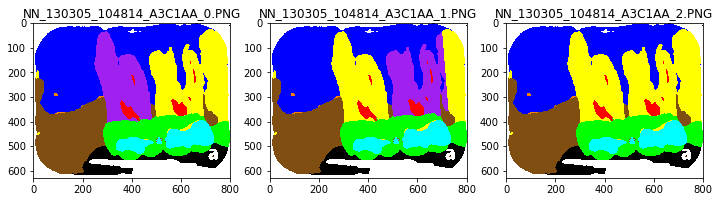

7 : NN_131008_142410_C0378E
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9338 | 31D          |       3 | 31_L                |      14.494 |           1 | NN_131008_142410_C0378E_0.PNG |
| 9339 | 31M          |       2 | 31_R                |    -999     |        -999 | NN_131008_142410_C0378E_0.PNG |
| 9340 | 29D          |       2 | 29_L                |    -999     |        -999 | NN_131008_142410_C0378E_1.PNG |
| 9341 | 29M          |       1 | 29_R                |      13.138 |           1 | NN_131008_142410_C0378E_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


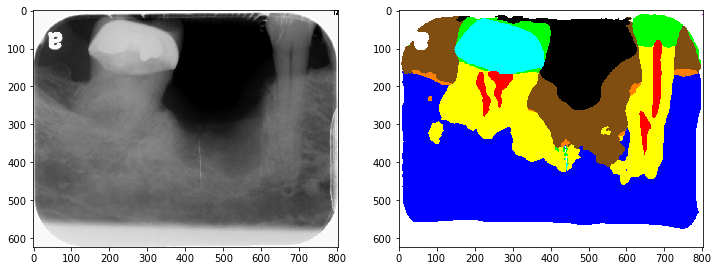

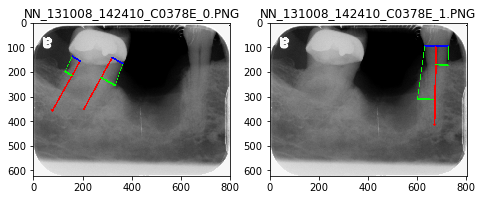

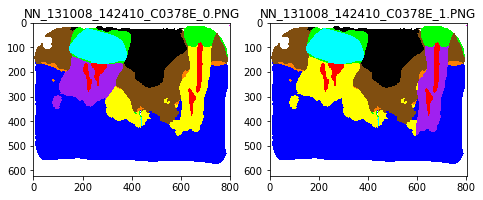

8 : NN_140130_095307_C056AD
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9759 | 7M           |       1 | No_match            | No_match    | No_match    | No_match                      |
| 9760 | 8D           |       2 | 8_L                 | 24.161      | 2           | NN_140130_095307_C056AD_1.PNG |
| 9761 | 8M           |       2 | 8_R                 | 17.601      | 2           | NN_140130_095307_C056AD_1.PNG |
| 9762 | 9M           |       2 | 9_L                 | 18.938      | 2           | NN_140130_095307_C056AD_2.PNG |
| 9763 | 9D           |       2 | 9_R                 | -999.0      | -999        | NN_140130_095307_C056AD_2.PNG |
+------+--------------+---------+-----------

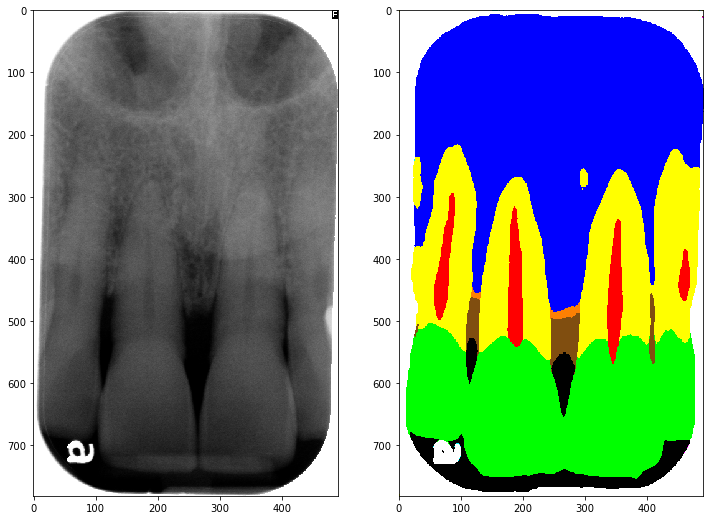

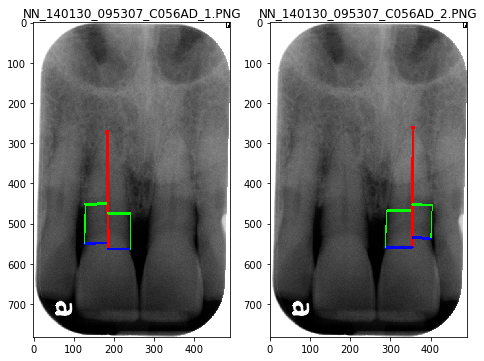

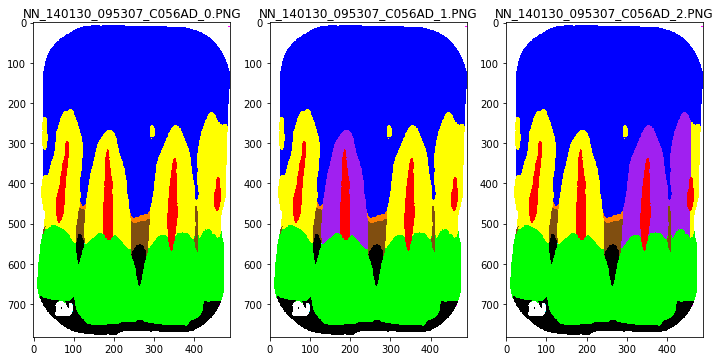

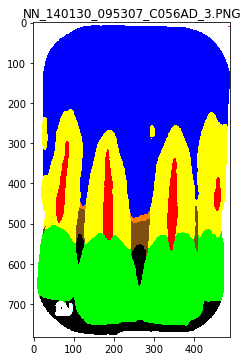

9 : NN_140312_140738_15CA8A
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 4177 | 8D           |       2 | 8_L                 | -999.0      | -999        | NN_140312_140738_15CA8A_1.PNG |
| 4178 | 8M           |       1 | 8_R                 | 11.882      | 1           | NN_140312_140738_15CA8A_1.PNG |
| 4179 | 9M           |       1 | 9_L                 | 18.544      | 2           | NN_140312_140738_15CA8A_2.PNG |
| 4180 | 9D           |       2 | 9_R                 | 26.844      | 2           | NN_140312_140738_15CA8A_2.PNG |
| 4181 | 10M          |       1 | No_match            | No_match    | No_match    | No_match                      |
+------+--------------+---------+-----------

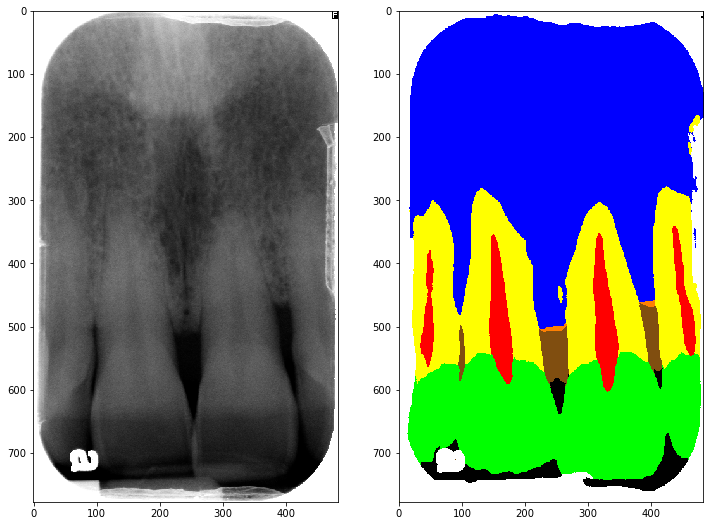

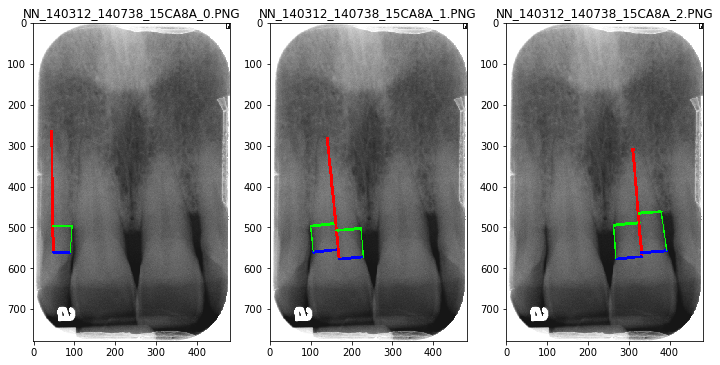

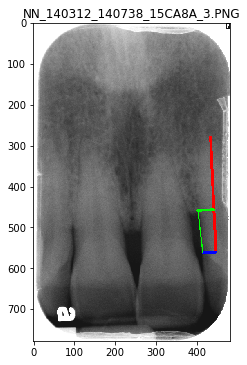

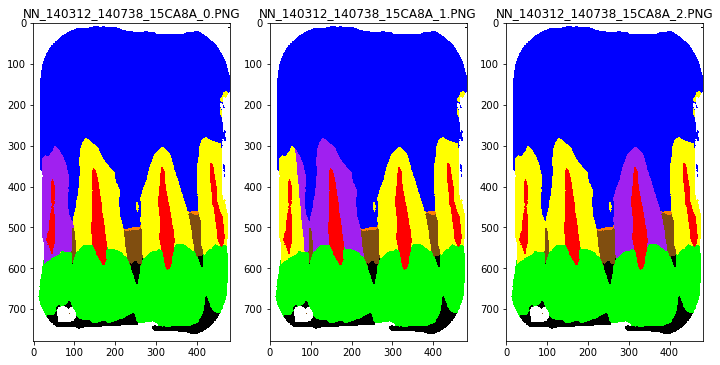

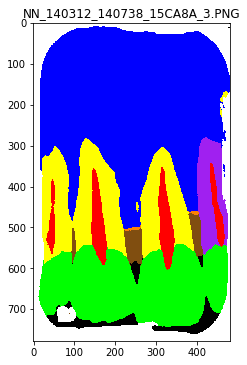

10 : NN_140312_140758_15CAA7
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 4187 | 1D           |       1 | 1_L                 |      11.83  |           1 | NN_140312_140758_15CAA7_0.PNG |
| 4188 | 1M           |       1 | 1_R                 |      12.789 |           1 | NN_140312_140758_15CAA7_0.PNG |
| 4189 | 2D           |       1 | 2_L                 |      14.294 |           1 | NN_140312_140758_15CAA7_1.PNG |
| 4190 | 2M           |       2 | 2_R                 |    -999     |        -999 | NN_140312_140758_15CAA7_1.PNG |
| 4191 | 3D           |       2 | 3_L                 |    -999     |        -999 | NN_140312_140758_15CAA7_2.PNG |
| 4192 | 3M           |       2 | 3_R      

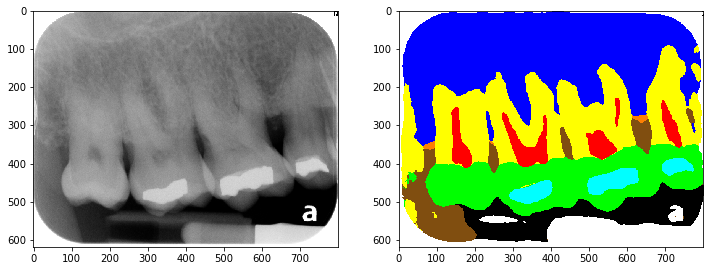

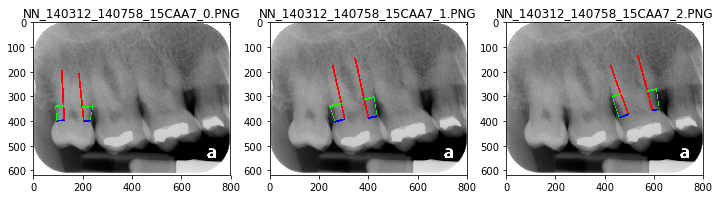

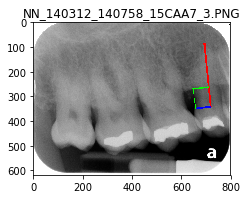

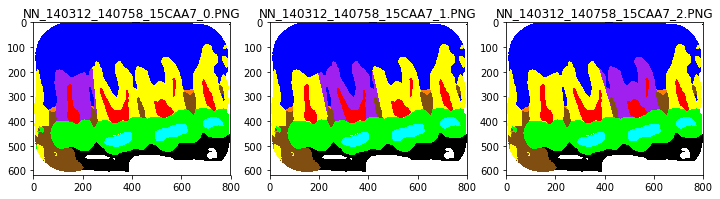

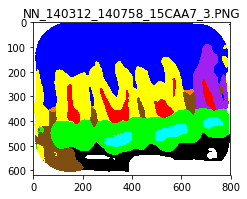

11 : NN_150413_144852_9B50CC
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9868 | 28D          |       2 | 28_L                |      28.166 |           2 | NN_150413_144852_9B50CC_0.PNG |
| 9869 | 28M          |       2 | 28_R                |    -999     |        -999 | NN_150413_144852_9B50CC_0.PNG |
| 9870 | 27M          |       1 | 27_R                |       8.683 |           1 | NN_150413_144852_9B50CC_1.PNG |
| 9871 | 26D          |       1 | 26_L                |      14.598 |           1 | NN_150413_144852_9B50CC_2.PNG |
| 9872 | 26M          |       1 | 26_R                |    -999     |        -999 | NN_150413_144852_9B50CC_2.PNG |
+------+--------------+---------+----------

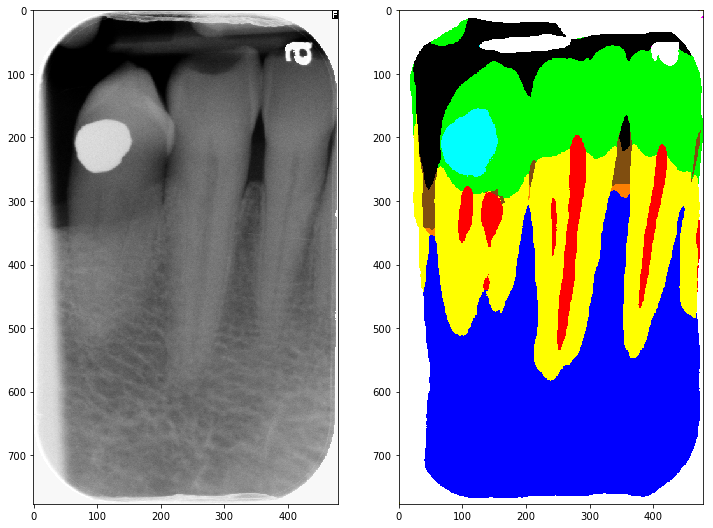

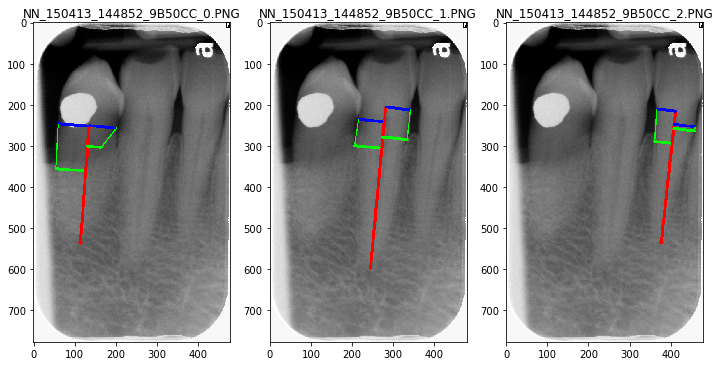

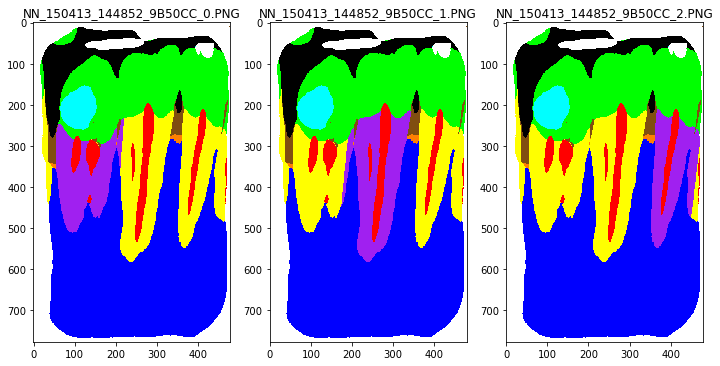

12 : NN_150413_145044_9B50CE
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9887 | 31D          |       1 | 31_L                |      21.56  |           2 | NN_150413_145044_9B50CE_0.PNG |
| 9888 | 31M          |       1 | 31_R                |       2.059 |           1 | NN_150413_145044_9B50CE_0.PNG |
| 9889 | 29D          |       2 | 29_L                |    -999     |        -999 | NN_150413_145044_9B50CE_2.PNG |
| 9890 | 29M          |       1 | 29_R                |       2.773 |           1 | NN_150413_145044_9B50CE_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


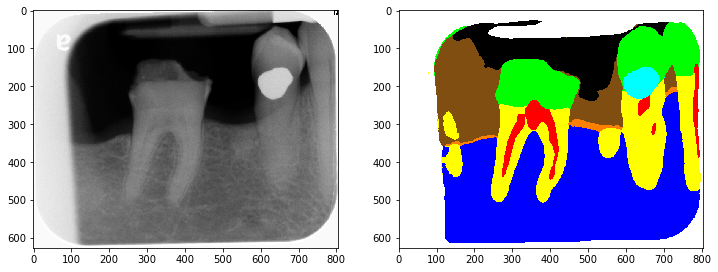

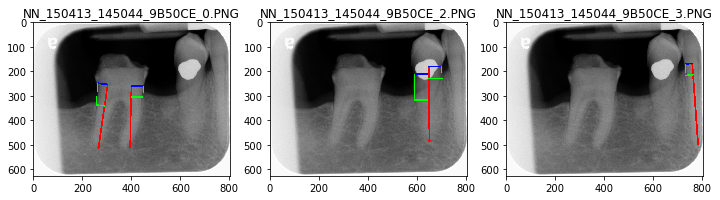

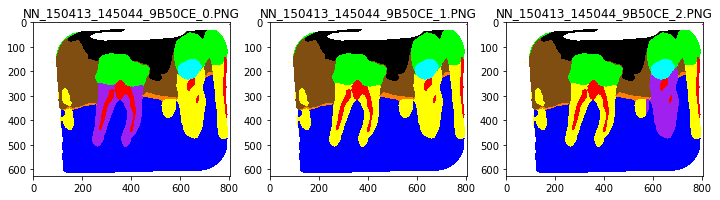

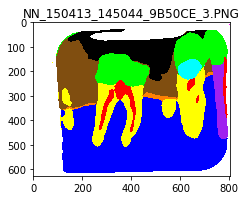

13 : NN_150416_154625_C0AC50
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 4639 | 23D          |       2 | 23_R                |       5.51  |           1 | NN_150416_154625_C0AC50_1.PNG |
| 4640 | 21M          |       0 | 21_L                |       5.936 |           1 | NN_150416_154625_C0AC50_3.PNG |
| 4641 | 21D          |       2 | 21_R                |    -999     |        -999 | NN_150416_154625_C0AC50_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


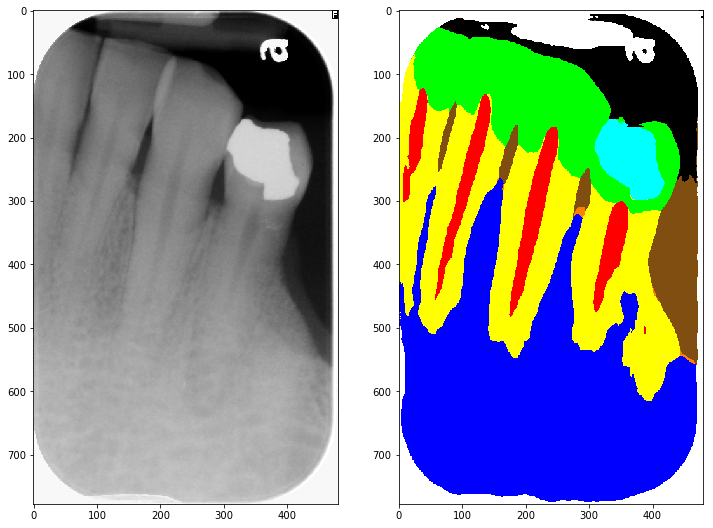

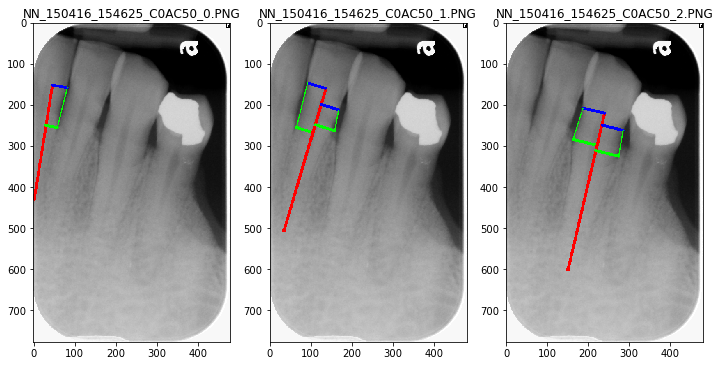

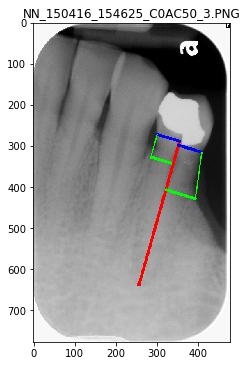

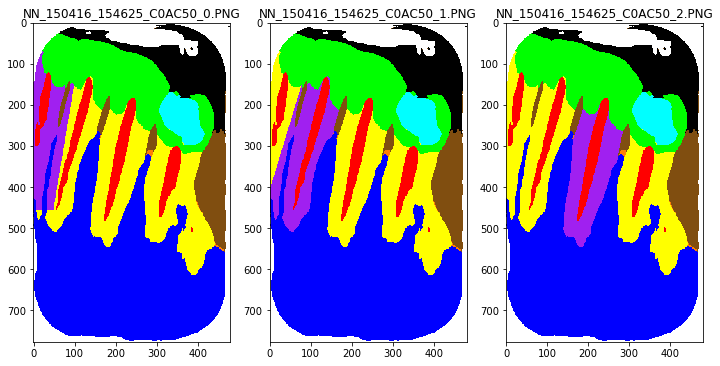

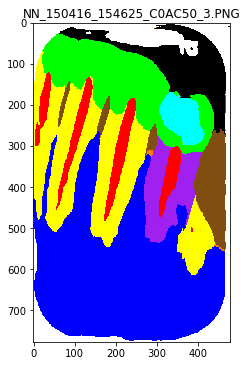

14 : NN_151007_102724_C04FF4
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9614 | 28D          |       2 | No_match            | No_match    | No_match    | No_match                      |
| 9615 | 28M          |       2 | No_match            | No_match    | No_match    | No_match                      |
| 9616 | 27D          |       2 | 27_L                | 14.386      | 1           | NN_151007_102724_C04FF4_1.PNG |
| 9617 | 27M          |       2 | 27_R                | 16.64       | 2           | NN_151007_102724_C04FF4_1.PNG |
| 9618 | 26D          |       2 | 26_L                | 16.706      | 2           | NN_151007_102724_C04FF4_2.PNG |
| 9619 | 26M          |       2 | 26_R     

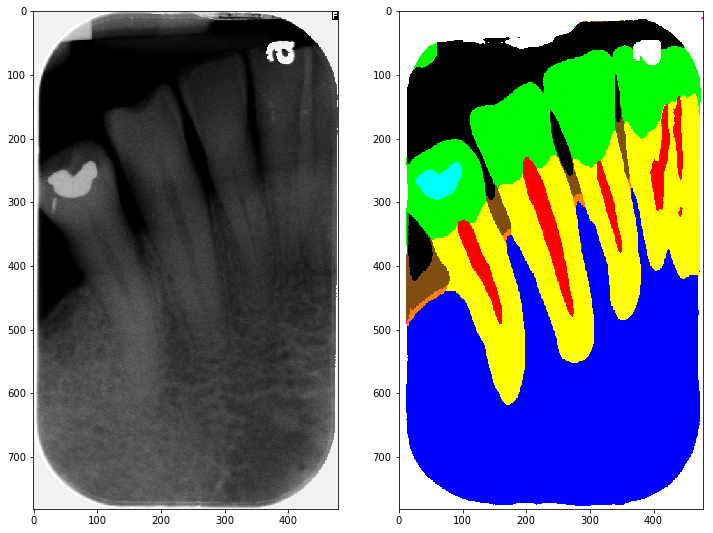

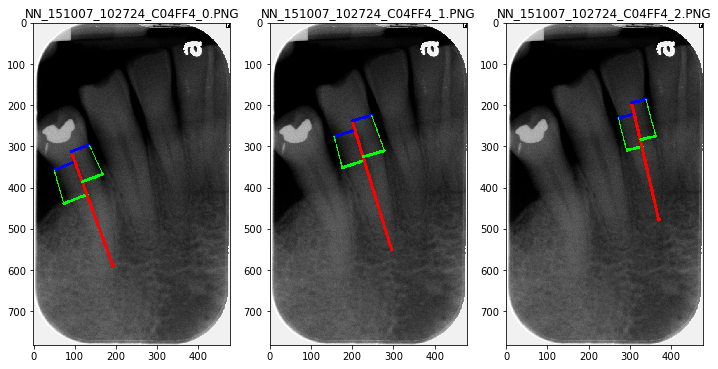

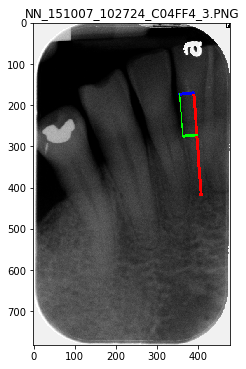

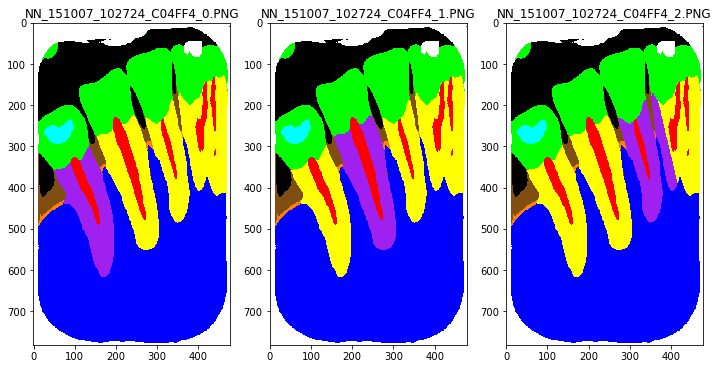

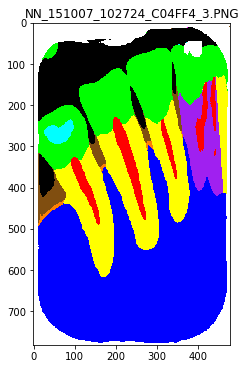

15 : NN_151207_094031_C03584
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 8984 | 12M          |       2 | 12_L                |    -999     |        -999 | NN_151207_094031_C03584_0.PNG |
| 8985 | 12D          |       1 | 12_R                |       6.972 |           1 | NN_151207_094031_C03584_0.PNG |
| 8986 | 13M          |       1 | 13_L                |       7.817 |           1 | NN_151207_094031_C03584_1.PNG |
| 8987 | 13D          |       0 | 13_R                |       3.461 |           1 | NN_151207_094031_C03584_1.PNG |
| 8988 | 14M          |       1 | 14_L                |       3.686 |           1 | NN_151207_094031_C03584_2.PNG |
| 8989 | 14D          |       1 | 14_R     

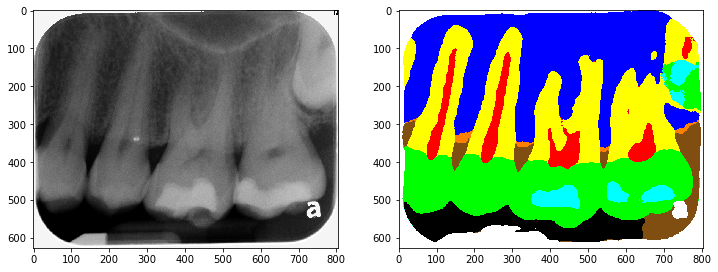

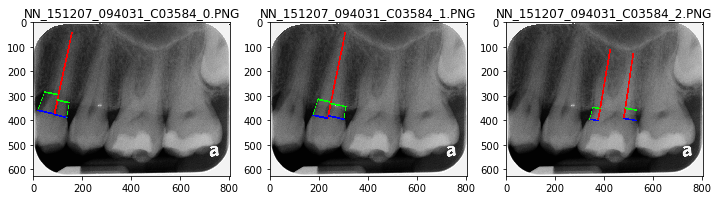

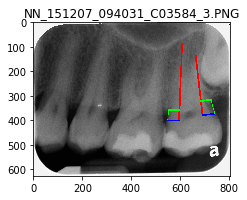

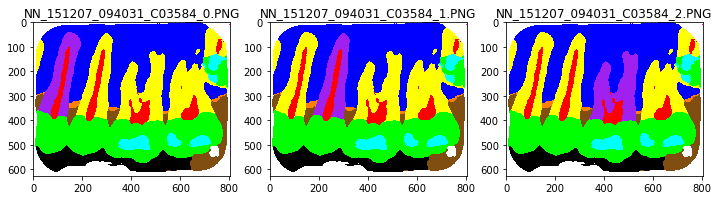

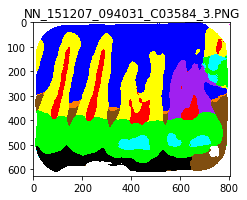

16 : NN_160822_112823_C0268C
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 8174 | 7M           |       2 | No_match            | No_match    | No_match    | No_match                      |
| 8175 | 8D           |       2 | 8_L                 | -999.0      | -999        | NN_160822_112823_C0268C_1.PNG |
| 8176 | 8M           |       1 | 8_R                 | 4.415       | 1           | NN_160822_112823_C0268C_1.PNG |
| 8177 | 9M           |       1 | 9_L                 | 0.0         | 0           | NN_160822_112823_C0268C_2.PNG |
| 8178 | 9D           |       1 | 9_R                 | 0.0         | 0           | NN_160822_112823_C0268C_2.PNG |
+------+--------------+---------+----------

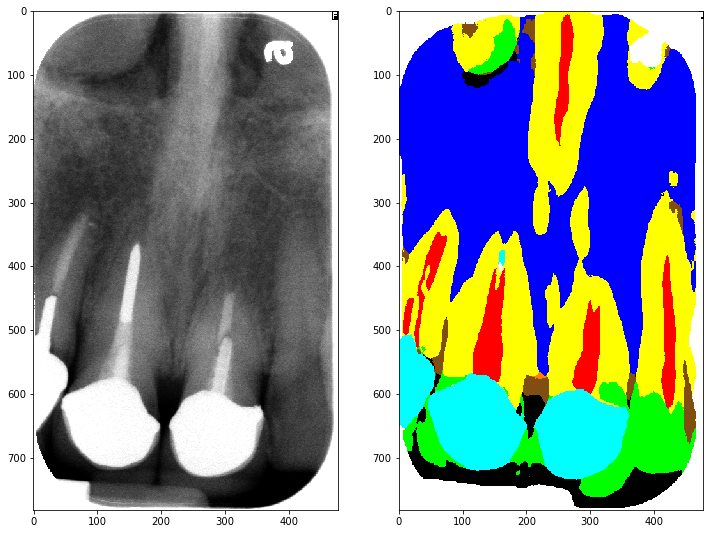

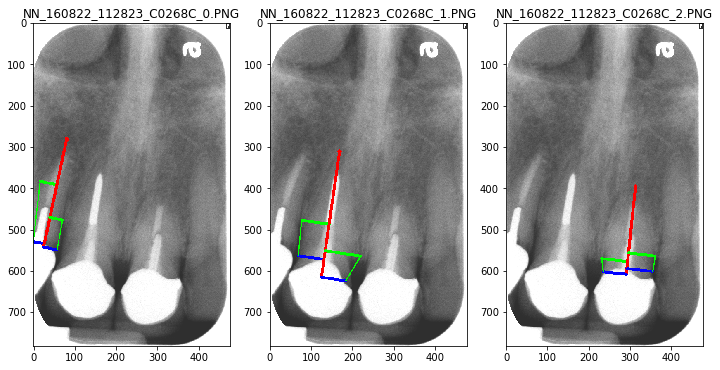

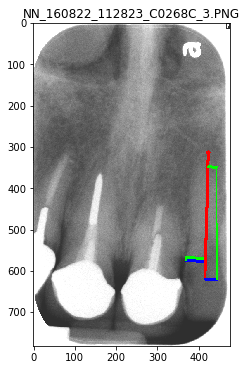

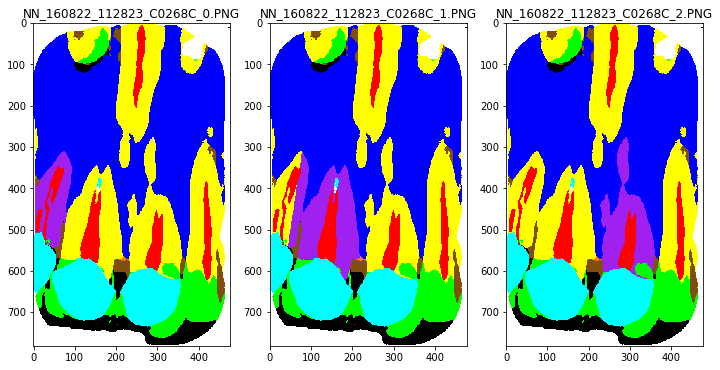

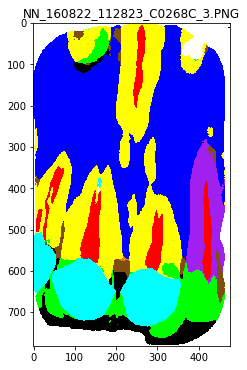

17 : NN_170227_095658_9C829D
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3481 | 9D           |       1 | No_match            | No_match    | No_match    | No_match                      |
| 3482 | 10M          |       2 | 10_L                | -999.0      | -999        | NN_170227_095658_9C829D_0.PNG |
| 3483 | 10D          |       2 | 10_R                | 7.121       | 1           | NN_170227_095658_9C829D_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


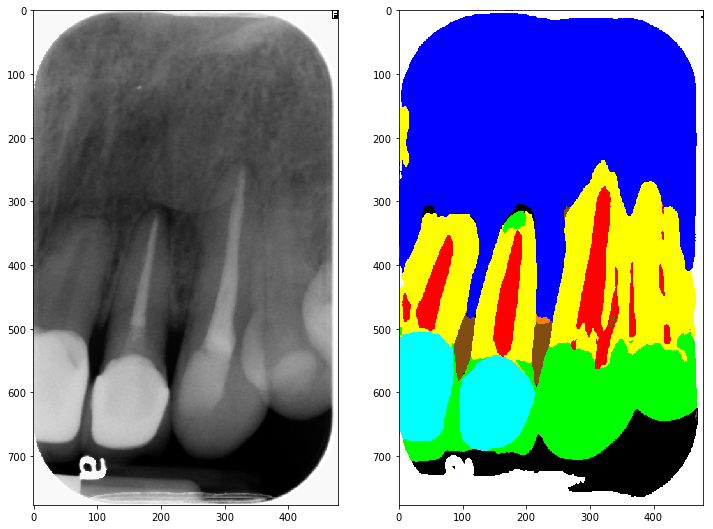

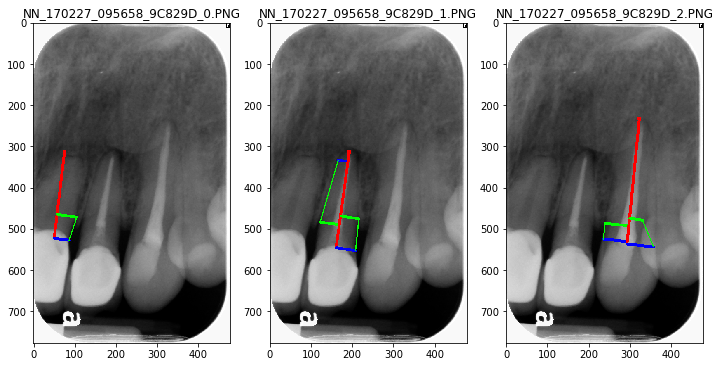

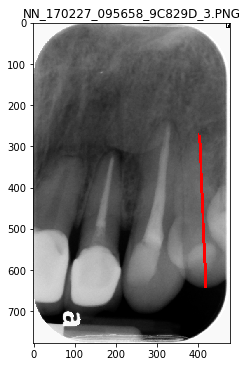

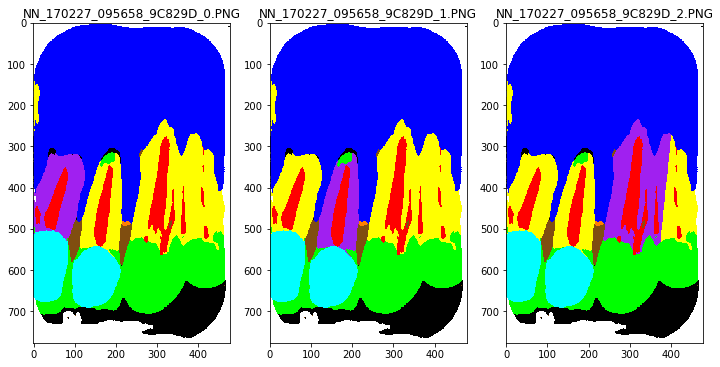

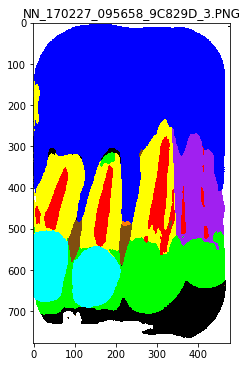

18 : NN_170310_135337_C0A86A
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3917 | 2D           |       2 | 2_L                 |      17.549 |           2 | NN_170310_135337_C0A86A_0.PNG |
| 3918 | 2M           |       1 | 2_R                 |       0.793 |           1 | NN_170310_135337_C0A86A_0.PNG |
| 3919 | 3D           |       1 | 3_L                 |       0.895 |           1 | NN_170310_135337_C0A86A_1.PNG |
| 3920 | 3M           |       2 | 3_R                 |    -999     |        -999 | NN_170310_135337_C0A86A_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


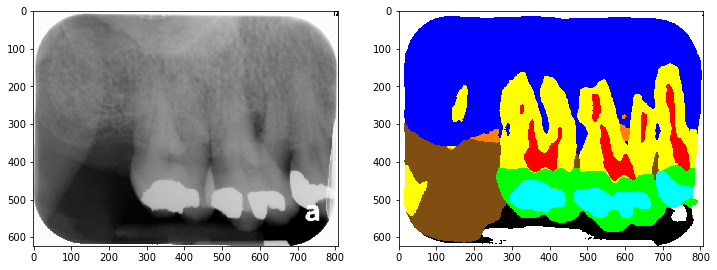

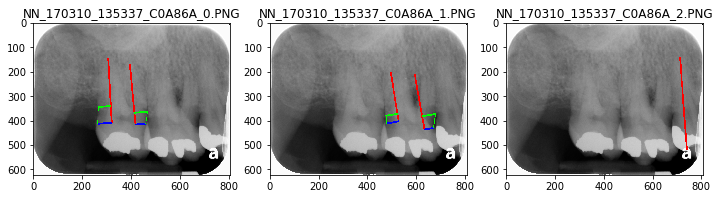

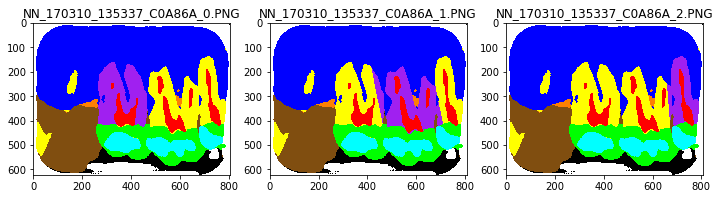

19 : NN_170503_151635_C02D00
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 8648 | 31D          |       2 | 31_L                |    -999     |        -999 | NN_170503_151635_C02D00_0.PNG |
| 8649 | 31M          |       1 | 31_R                |       0.064 |           1 | NN_170503_151635_C02D00_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


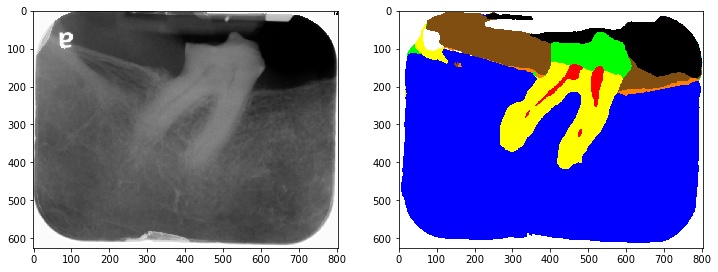

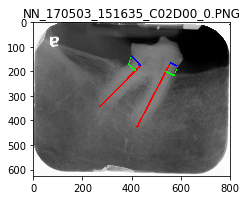

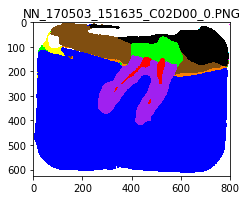

20 : NN_170911_145829_15C28E
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 4079 | 28D          |       1 | 28_L                | 0.0         | 0           | NN_170911_145829_15C28E_0.PNG |
| 4080 | 28M          |       1 | 28_R                | 8.013       | 1           | NN_170911_145829_15C28E_0.PNG |
| 4081 | 27D          |       1 | 27_L                | 0.0         | 0           | NN_170911_145829_15C28E_1.PNG |
| 4082 | 27M          |       2 | 27_R                | 19.35       | 2           | NN_170911_145829_15C28E_1.PNG |
| 4083 | 26D          |       2 | 26_L                | 23.908      | 2           | NN_170911_145829_15C28E_2.PNG |
| 4084 | 26M          |       2 | 26_R     

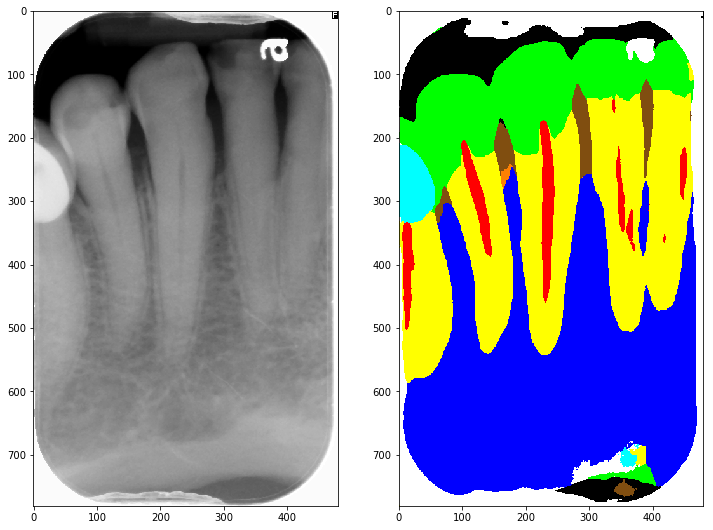

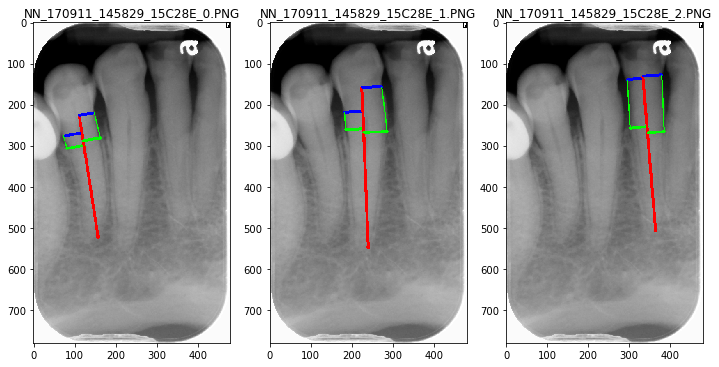

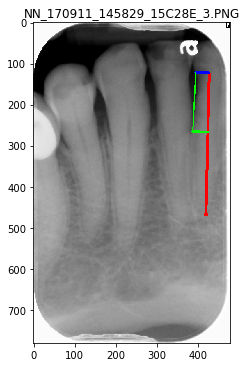

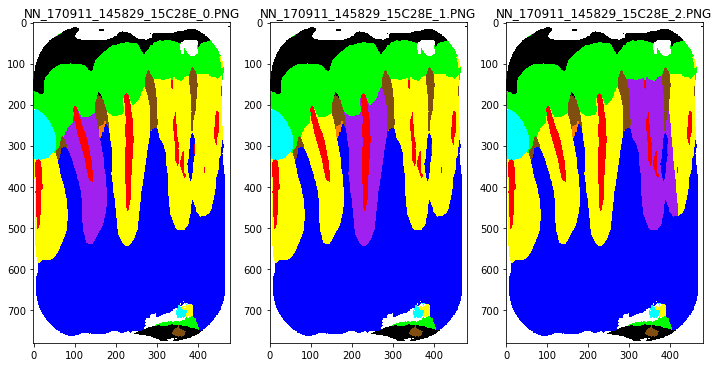

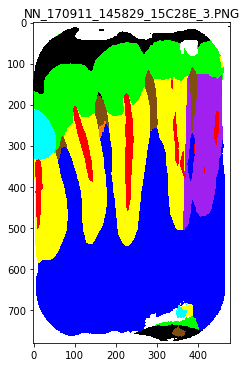

21 : NN_180220_135622_16FA59
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 5499 | 18M          |       2 | 18_L                |      14.733 |           1 | NN_180220_135622_16FA59_0.PNG |
| 5500 | 18D          |       2 | 18_R                |    -999     |        -999 | NN_180220_135622_16FA59_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


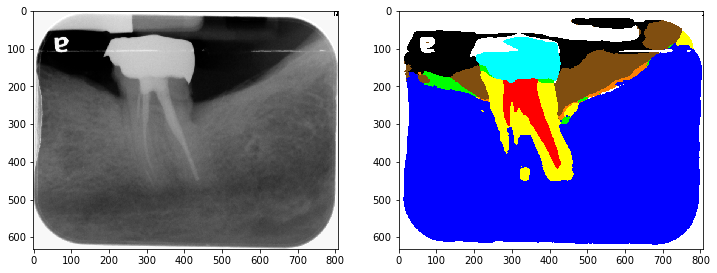

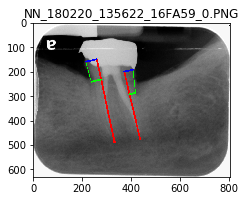

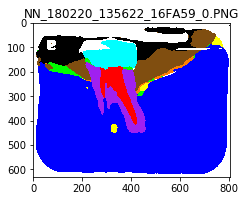

22 : NN_180308_141252_16FA65
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 5562 | 12M          |       1 | 12_L                |       7.305 |           1 | NN_180308_141252_16FA65_0.PNG |
| 5563 | 12D          |       1 | 12_R                |      13.353 |           1 | NN_180308_141252_16FA65_0.PNG |
| 5564 | 13M          |       1 | 13_L                |      15.783 |           2 | NN_180308_141252_16FA65_1.PNG |
| 5565 | 13D          |       1 | 13_R                |      24.579 |           2 | NN_180308_141252_16FA65_1.PNG |
| 5566 | 14M          |       1 | 14_L                |      15.423 |           2 | NN_180308_141252_16FA65_2.PNG |
| 5567 | 14D          |       2 | 14_R     

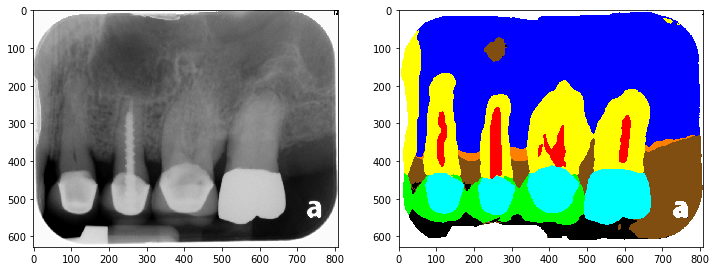

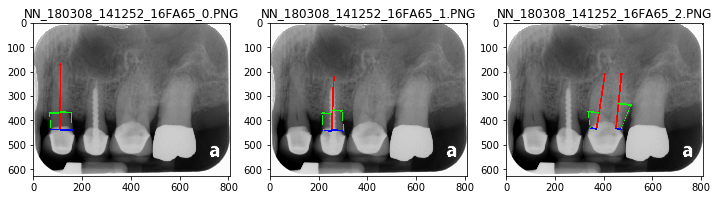

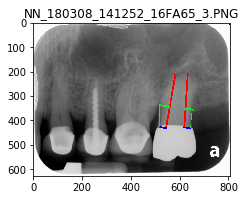

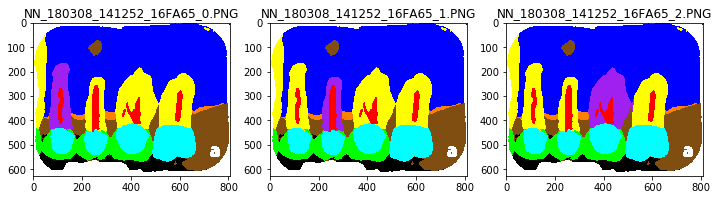

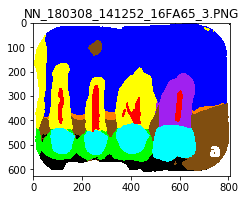

23 : NN_181008_093213_16E207
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 6328 | 26M          |       2 | 26_R                |      29.011 |           2 | NN_181008_093213_16E207_1.PNG |
| 6329 | 25D          |       2 | 25_L                |      29.428 |           2 | NN_181008_093213_16E207_2.PNG |
| 6330 | 25M          |       2 | 25_R                |      39.588 |           3 | NN_181008_093213_16E207_2.PNG |
| 6331 | 24M          |       2 | 24_L                |      38.227 |           3 | NN_181008_093213_16E207_3.PNG |
| 6332 | 24D          |       2 | 24_R                |    -999     |        -999 | NN_181008_093213_16E207_3.PNG |
| 6333 | 23M          |       2 | 23_L     

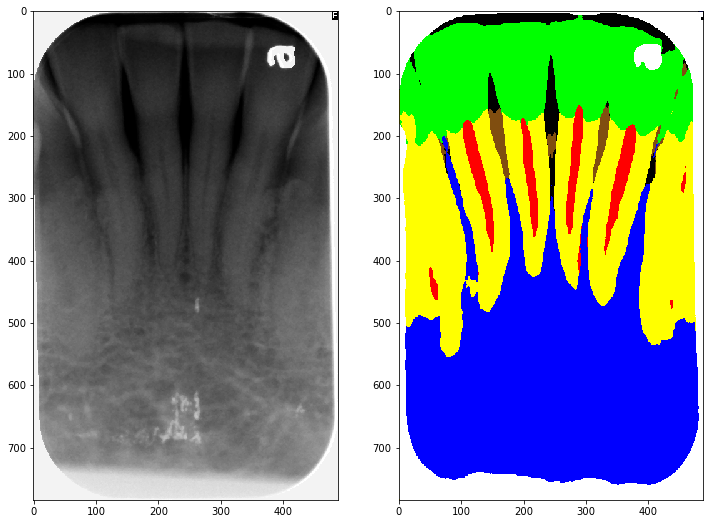

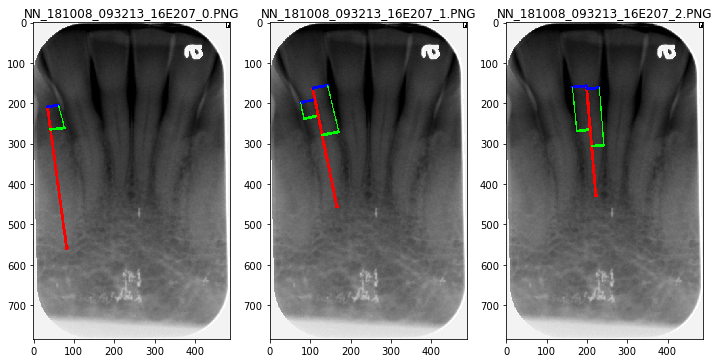

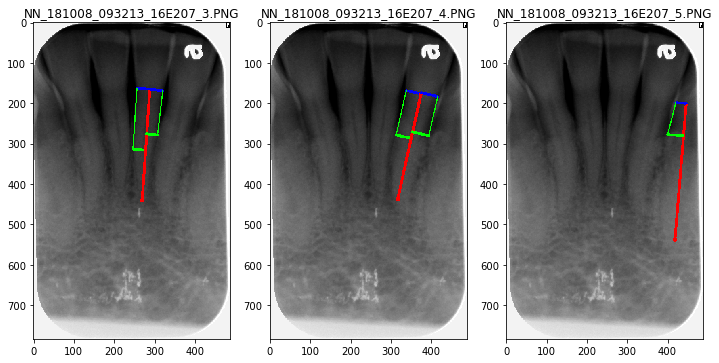

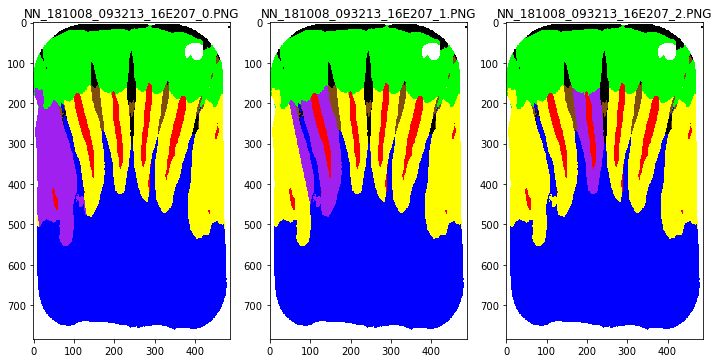

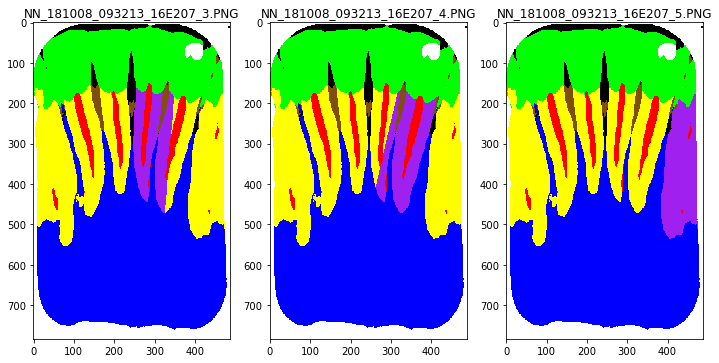

24 : NN_181012_144021_16D115
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 5602 | 4D           |       2 | 4_L                 |    -999     |        -999 | NN_181012_144021_16D115_1.PNG |
| 5603 | 5D           |       1 | 5_L                 |      11.675 |           1 | NN_181012_144021_16D115_2.PNG |
| 5604 | 5M           |       1 | 5_R                 |       6.245 |           1 | NN_181012_144021_16D115_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


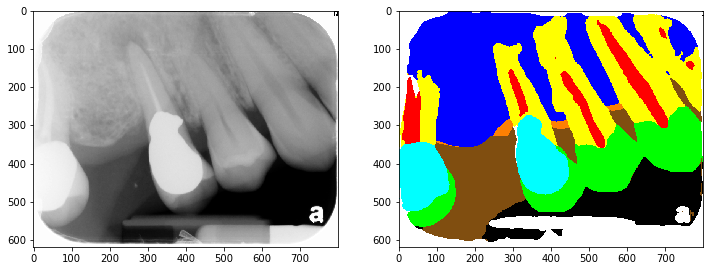

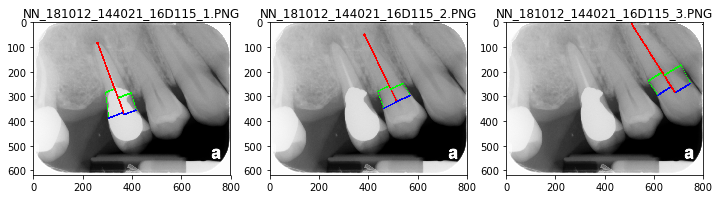

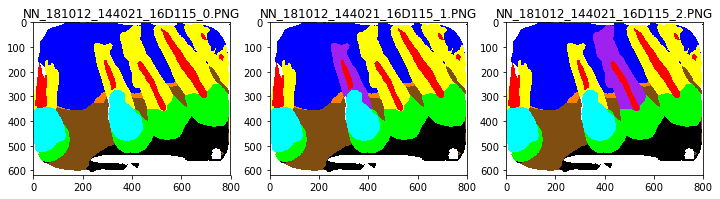

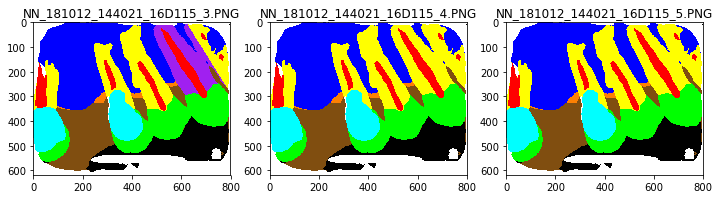

25 : NN_181017_160948_171A27
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 5358 | 28D          |       2 | 28_L                | -999.0      | -999        | NN_181017_160948_171A27_0.PNG |
| 5359 | 27M          |       2 | 27_R                | 20.743      | 2           | NN_181017_160948_171A27_1.PNG |
| 5360 | 26D          |       2 | No_match            | No_match    | No_match    | No_match                      |
| 5361 | 26M          |       2 | No_match            | No_match    | No_match    | No_match                      |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


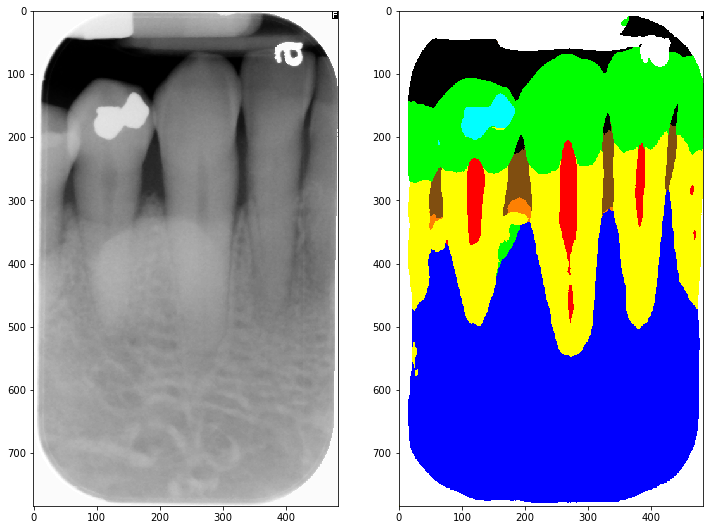

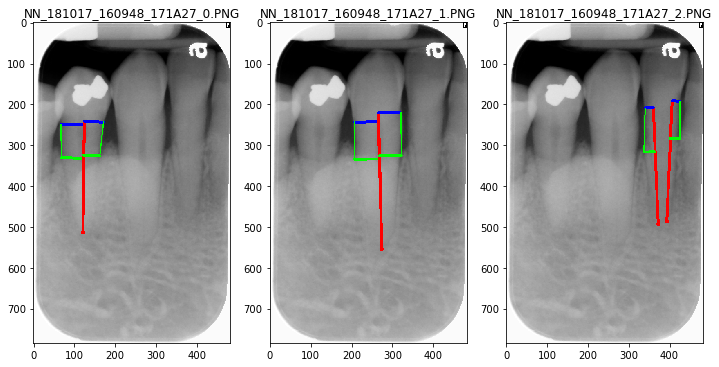

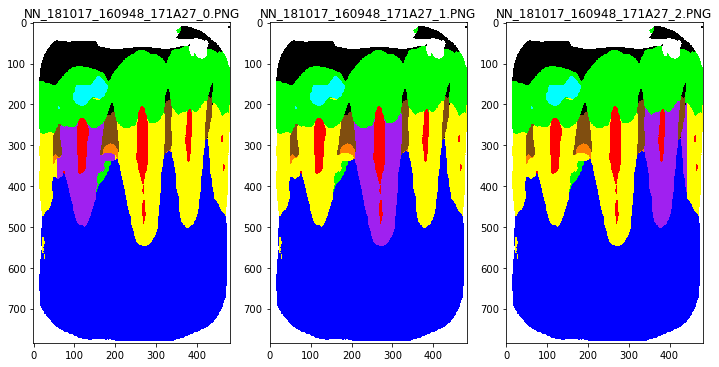

26 : NN_181017_161028_171A1C
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 5378 | 23M          |       2 | 23_L                |      13.534 |           1 | NN_181017_161028_171A1C_0.PNG |
| 5379 | 23D          |       2 | 23_R                |      24.391 |           2 | NN_181017_161028_171A1C_0.PNG |
| 5380 | 22M          |       2 | 22_L                |      20.486 |           2 | NN_181017_161028_171A1C_1.PNG |
| 5381 | 22D          |       2 | 22_R                |    -999     |        -999 | NN_181017_161028_171A1C_1.PNG |
| 5382 | 21M          |       2 | 21_L                |    -999     |        -999 | NN_181017_161028_171A1C_2.PNG |
| 5383 | 21D          |       2 | 21_R     

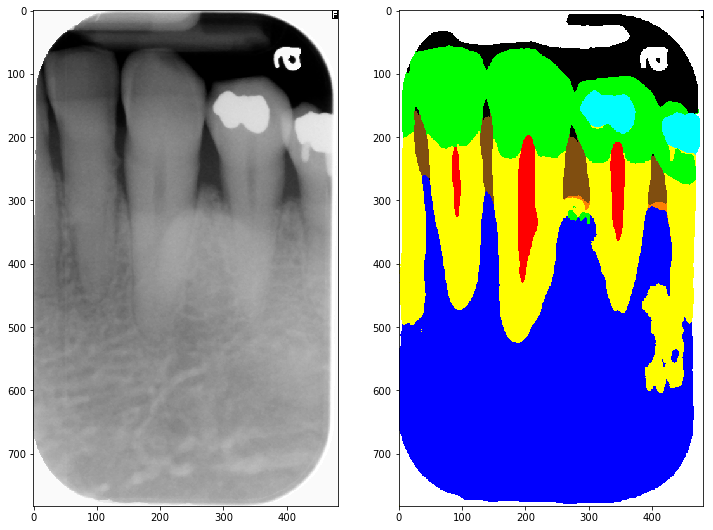

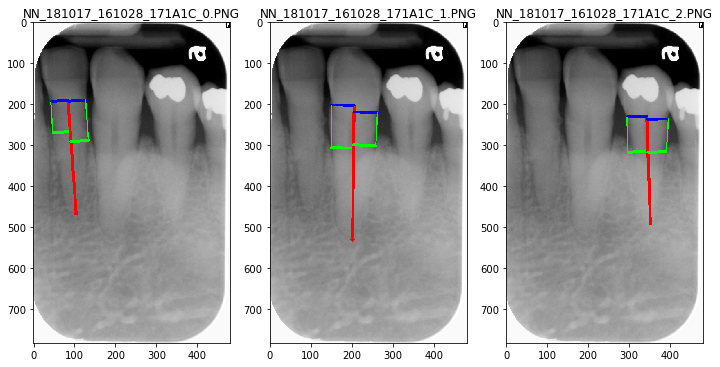

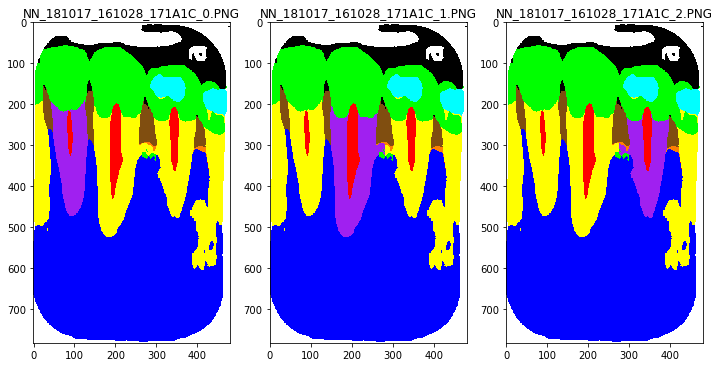

27 : NN_190109_093407_15D3BD
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3850 | 31M          |       2 | No_match            | No_match    | No_match    | No_match                      |
| 3851 | 30D          |       2 | 30_L                | -999.0      | -999        | NN_190109_093407_15D3BD_1.PNG |
| 3852 | 30M          |       1 | 30_R                | 10.312      | 1           | NN_190109_093407_15D3BD_1.PNG |
| 3853 | 29D          |       1 | 29_L                | 11.793      | 1           | NN_190109_093407_15D3BD_2.PNG |
| 3854 | 29M          |       1 | 29_R                | 12.347      | 1           | NN_190109_093407_15D3BD_2.PNG |
| 3855 | 28D          |       1 | 28_L     

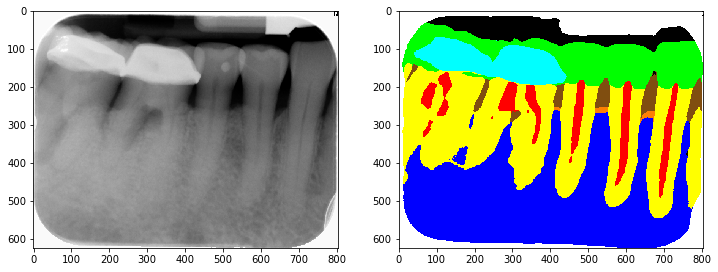

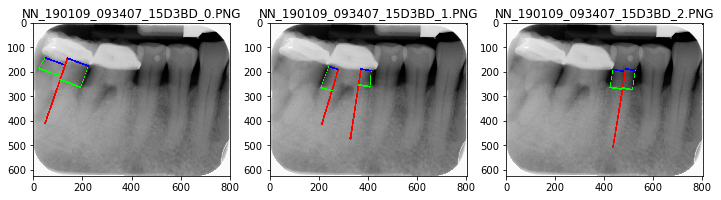

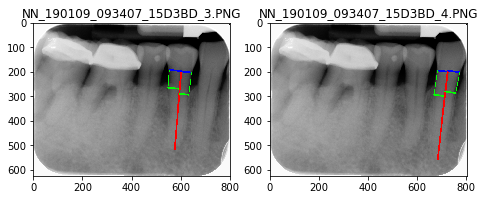

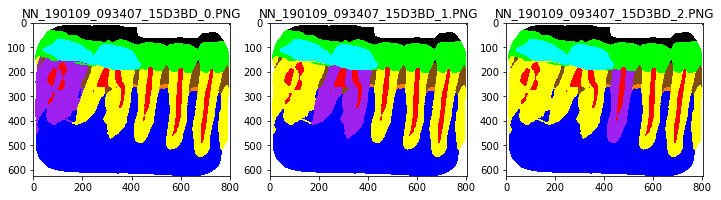

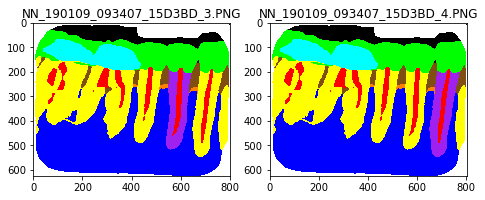

28 : NN_190115_155632_15D8C5
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 6831 | 31D          |       1 | 31_L                |       7.656 |           1 | NN_190115_155632_15D8C5_0.PNG |
| 6832 | 31M          |       2 | 31_R                |    -999     |        -999 | NN_190115_155632_15D8C5_0.PNG |
| 6833 | 30D          |       2 | 30_L                |    -999     |        -999 | NN_190115_155632_15D8C5_1.PNG |
| 6834 | 30M          |       1 | 30_R                |       0     |           0 | NN_190115_155632_15D8C5_1.PNG |
| 6835 | 29D          |       1 | 29_L                |       7.03  |           1 | NN_190115_155632_15D8C5_2.PNG |
| 6836 | 29M          |       1 | 29_R     

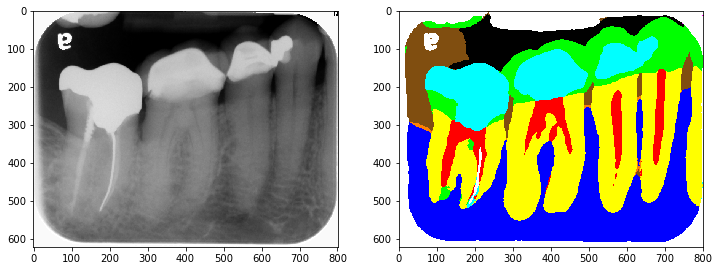

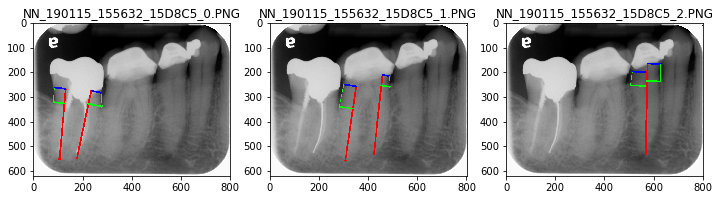

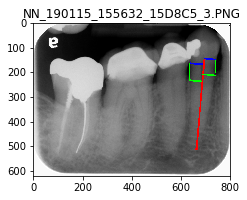

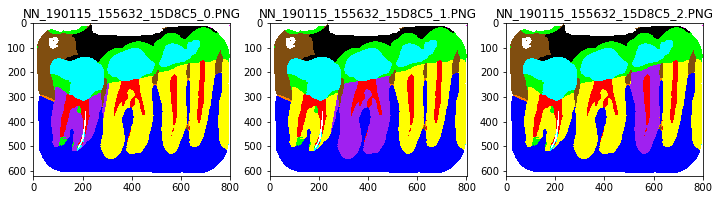

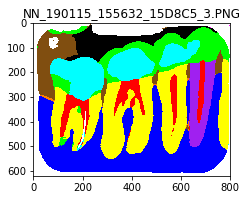

29 : NN_190227_094453_15BFF8
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 5867 | 2D           |       2 | 2_L                 |      36.26  |           3 | NN_190227_094453_15BFF8_0.PNG |
| 5868 | 4D           |       1 | 4_L                 |       1.084 |           1 | NN_190227_094453_15BFF8_2.PNG |
| 5869 | 4M           |       2 | 4_R                 |    -999     |        -999 | NN_190227_094453_15BFF8_2.PNG |
| 5870 | 5D           |       2 | 5_L                 |    -999     |        -999 | NN_190227_094453_15BFF8_3.PNG |
| 5871 | 5M           |       2 | 5_R                 |      21.839 |           2 | NN_190227_094453_15BFF8_3.PNG |
+------+--------------+---------+----------

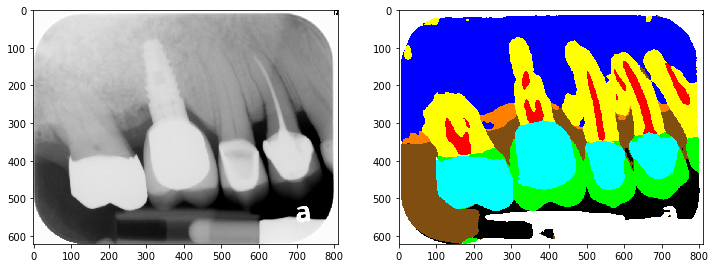

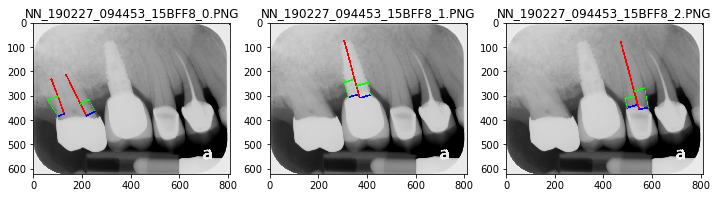

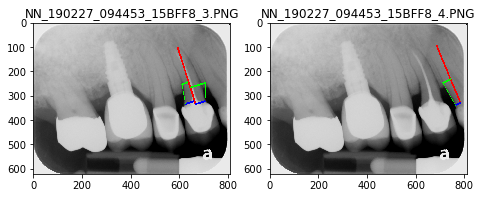

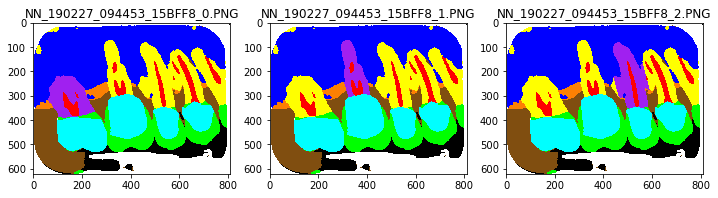

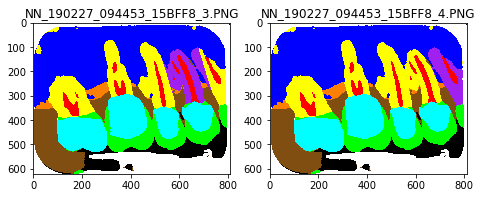

30 : NN_190228_154703_4AB56
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 2154 | 27D          |       1 | 27_L                |       8.092 |           1 | NN_190228_154703_4AB56_2.PNG |
| 2155 | 27M          |       1 | 27_R                |      12.947 |           1 | NN_190228_154703_4AB56_2.PNG |
| 2156 | 26D          |       2 | 26_L                |      21.266 |           2 | NN_190228_154703_4AB56_3.PNG |
| 2157 | 26M          |       2 | 26_R                |    -999     |        -999 | NN_190228_154703_4AB56_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+


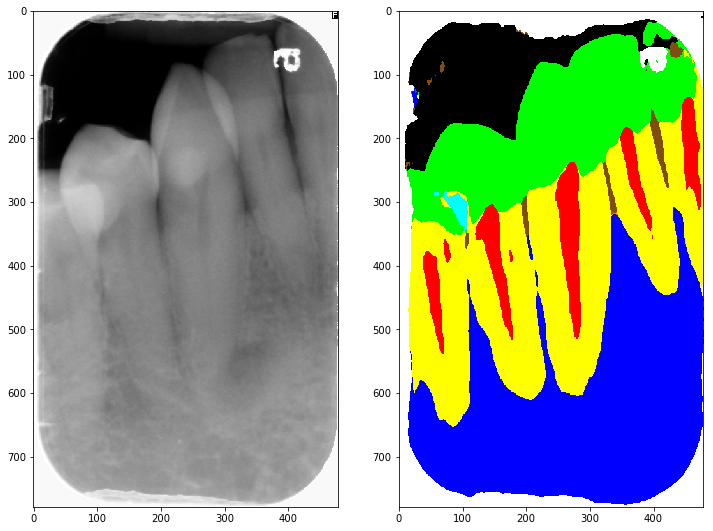

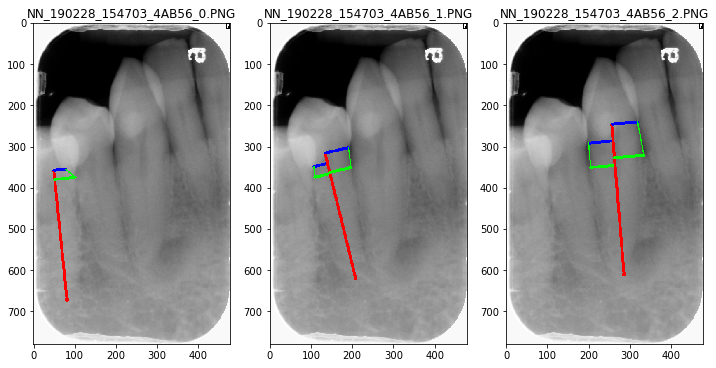

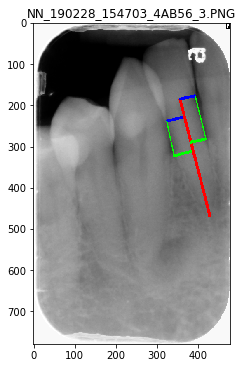

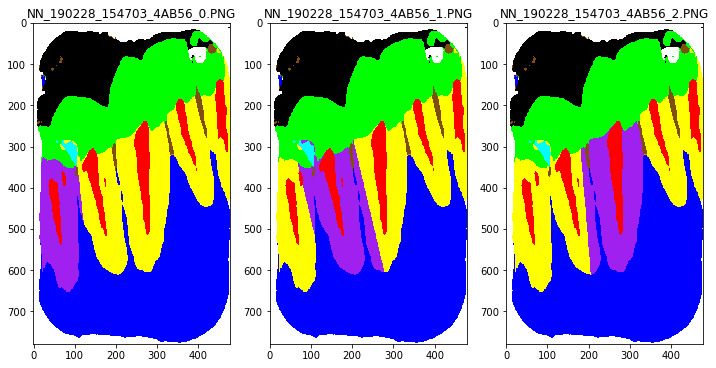

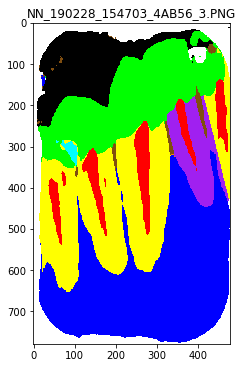

31 : NN_190305_153155_EAB2D
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 6894 | 7D           |       3 | 7_L                 |      41.91  |           3 | NN_190305_153155_EAB2D_1.PNG |
| 6895 | 7M           |       3 | 7_R                 |      32.395 |           2 | NN_190305_153155_EAB2D_1.PNG |
| 6896 | 8D           |       3 | 8_L                 |      55.966 |           3 | NN_190305_153155_EAB2D_2.PNG |
| 6897 | 8M           |       2 | 8_R                 |    -999     |        -999 | NN_190305_153155_EAB2D_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+


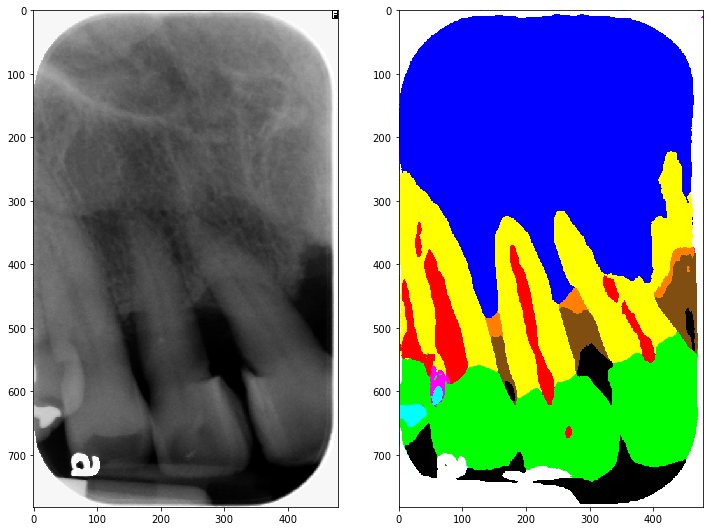

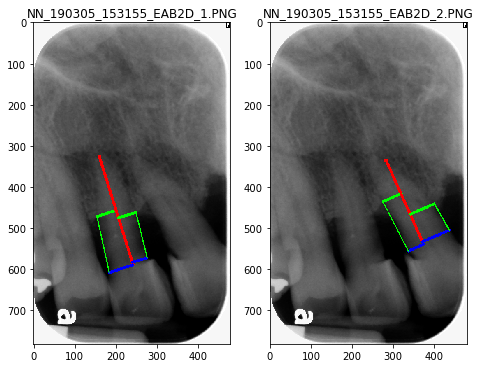

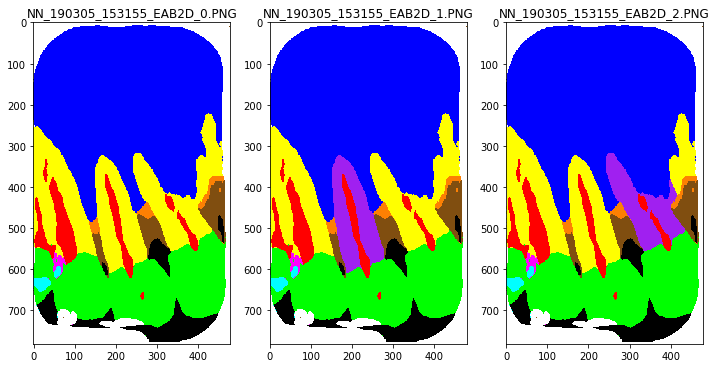

32 : NN_190313_140955_15CCDB
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 4232 | 3D           |       2 | 3_L                 |    -999     |        -999 | NN_190313_140955_15CCDB_1.PNG |
| 4233 | 3M           |       2 | 3_R                 |      24.472 |           2 | NN_190313_140955_15CCDB_1.PNG |
| 4234 | 4D           |       3 | 4_L                 |      35.982 |           3 | NN_190313_140955_15CCDB_2.PNG |
| 4235 | 4M           |       3 | 4_R                 |      27.71  |           2 | NN_190313_140955_15CCDB_2.PNG |
| 4236 | 5D           |       2 | 5_L                 |      25.268 |           2 | NN_190313_140955_15CCDB_3.PNG |
| 4237 | 5M           |       2 | 5_R      

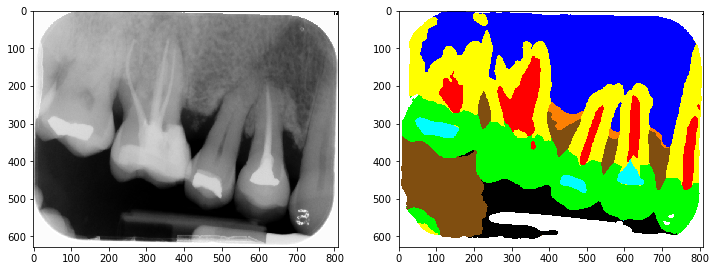

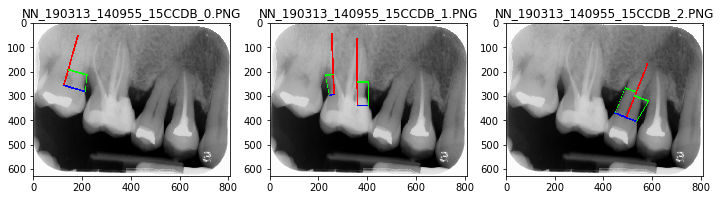

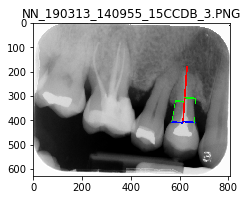

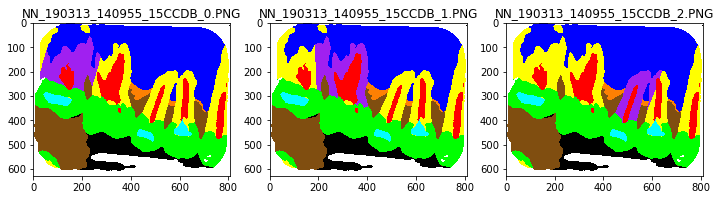

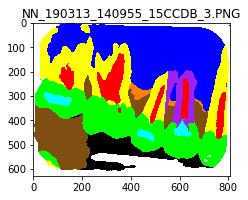

33 : NN_190313_141058_15CCB9
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 4238 | 1D           |       2 | 1_L                 |       6.906 |           1 | NN_190313_141058_15CCB9_0.PNG |
| 4239 | 1M           |       2 | 1_R                 |      14.173 |           1 | NN_190313_141058_15CCB9_0.PNG |
| 4240 | 2D           |       2 | 2_L                 |      14.45  |           1 | NN_190313_141058_15CCB9_1.PNG |
| 4241 | 2M           |       2 | 2_R                 |    -999     |        -999 | NN_190313_141058_15CCB9_1.PNG |
| 4242 | 3D           |       2 | 3_L                 |    -999     |        -999 | NN_190313_141058_15CCB9_2.PNG |
| 4243 | 3M           |       2 | 3_R      

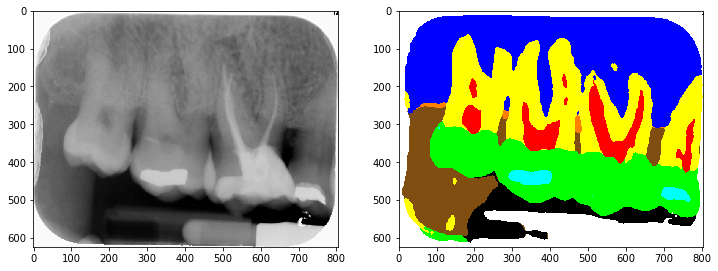

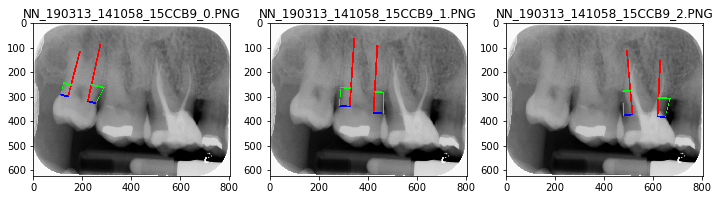

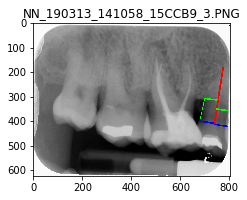

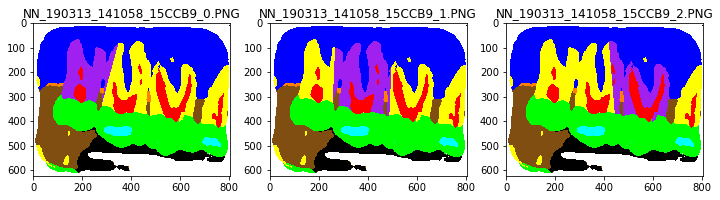

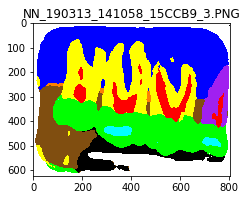

34 : NN_190318_155201_ABEEA8
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7043 | 20M          |       2 | No_match            | No_match    | No_match    | No_match                      |
| 7044 | 20D          |       2 | 20_R                | -999.0      | -999        | NN_190318_155201_ABEEA8_0.PNG |
| 7045 | 19M          |       2 | 19_L                | 35.277      | 3           | NN_190318_155201_ABEEA8_1.PNG |
| 7046 | 19D          |       2 | 19_R                | -999.0      | -999        | NN_190318_155201_ABEEA8_1.PNG |
| 7047 | 18M          |       1 | 18_L                | 16.62       | 2           | NN_190318_155201_ABEEA8_2.PNG |
| 7048 | 18D          |       1 | 18_R     

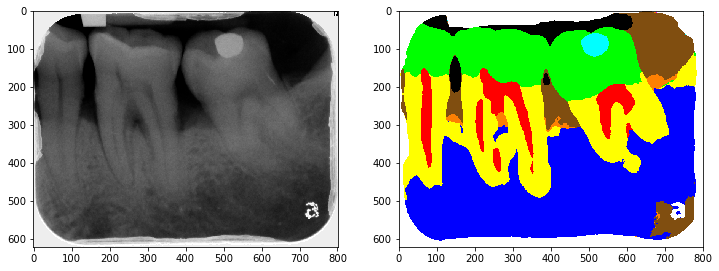

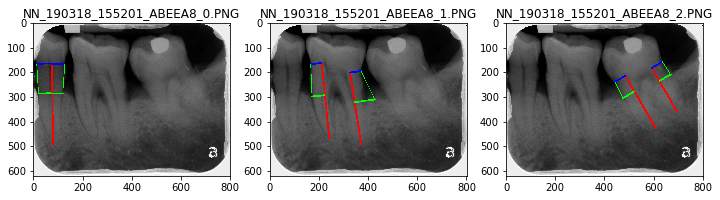

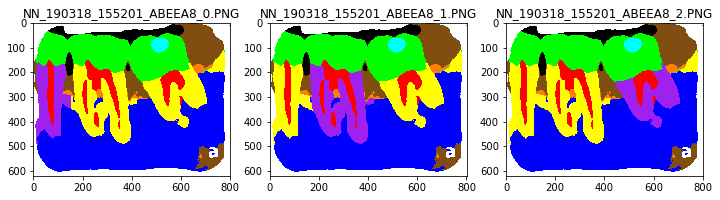

35 : NN_190318_155230_ABEEA0
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7053 | 31M          |       2 | 31_R                |      13.654 |           1 | NN_190318_155230_ABEEA0_1.PNG |
| 7054 | 29D          |       2 | 29_L                |      22.879 |           2 | NN_190318_155230_ABEEA0_3.PNG |
| 7055 | 29M          |       2 | 29_R                |    -999     |        -999 | NN_190318_155230_ABEEA0_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+


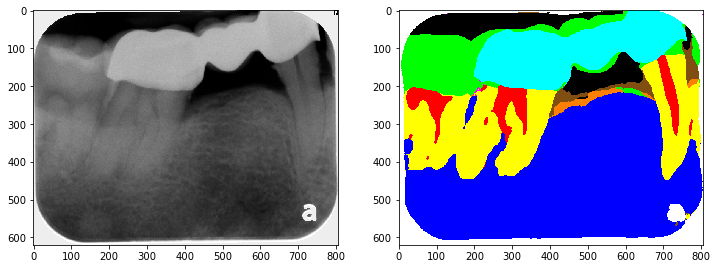

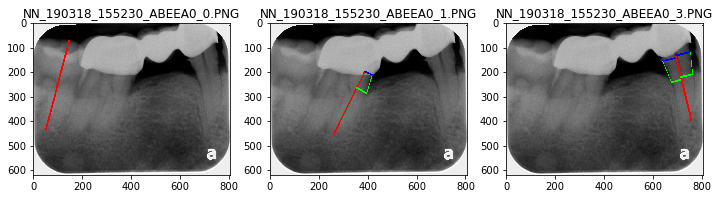

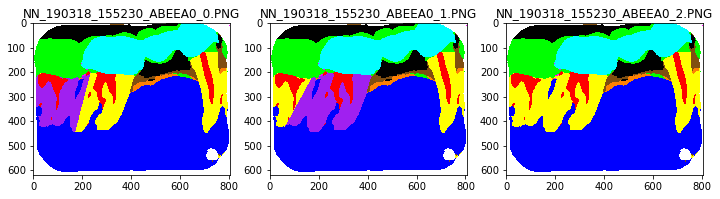

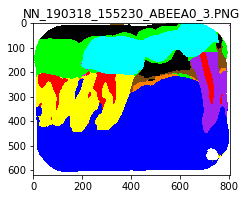

36 : NN_190318_155230_ABEEA9
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7056 | 1D           |       2 | 1_L                 |    -999     |        -999 | NN_190318_155230_ABEEA9_0.PNG |
| 7057 | 1M           |       3 | 1_R                 |      54.835 |           3 | NN_190318_155230_ABEEA9_0.PNG |
| 7058 | 2D           |       3 | 2_L                 |      56.019 |           3 | NN_190318_155230_ABEEA9_1.PNG |
| 7059 | 2M           |       3 | 2_R                 |      37.69  |           3 | NN_190318_155230_ABEEA9_1.PNG |
| 7060 | 3D           |       3 | 3_L                 |      62.798 |           3 | NN_190318_155230_ABEEA9_2.PNG |
| 7061 | 3M           |       3 | 3_R      

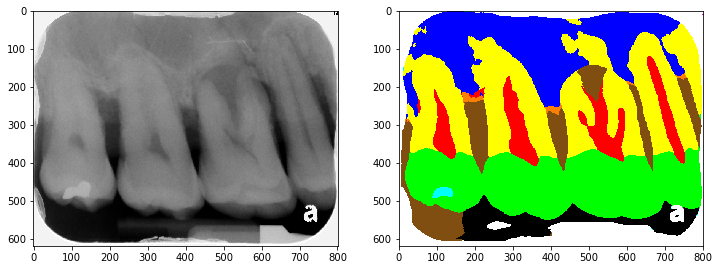

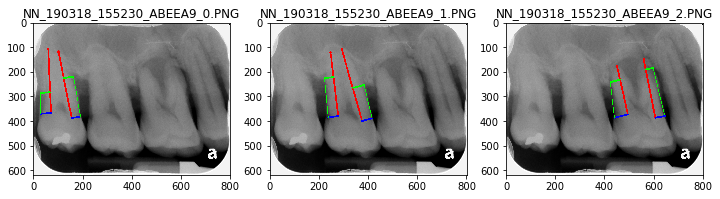

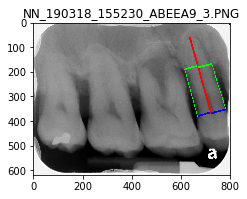

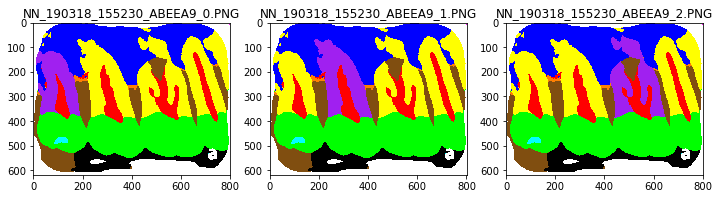

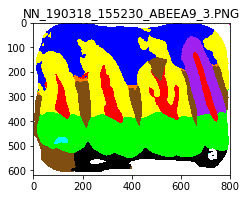

37 : NN_190424_134341_EA979
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 4133 | 13M          |       1 | 13_L                |      13.671 |           1 | NN_190424_134341_EA979_1.PNG |
| 4134 | 13D          |       2 | 13_R                |    -999     |        -999 | NN_190424_134341_EA979_1.PNG |
| 4135 | 14M          |       3 | 14_L                |       0     |           0 | NN_190424_134341_EA979_2.PNG |
| 4136 | 14D          |       2 | 14_R                |      16.709 |           2 | NN_190424_134341_EA979_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+


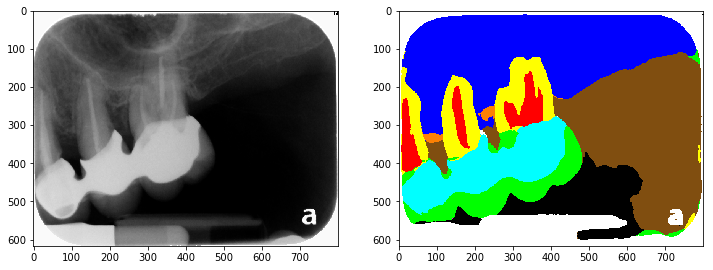

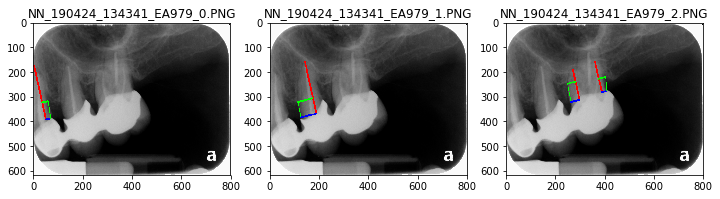

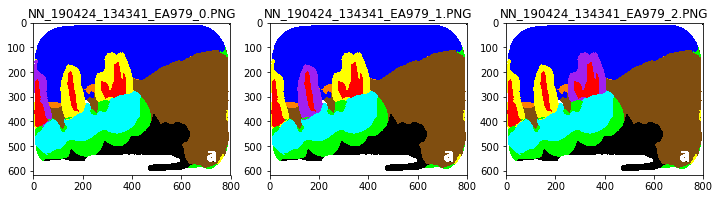

38 : NN_190604_134716_EA7E8
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 7144 | 29D          |       2 | 29_L                |    -999     |        -999 | NN_190604_134716_EA7E8_0.PNG |
| 7145 | 29M          |       3 | 29_R                |      24.794 |           2 | NN_190604_134716_EA7E8_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+


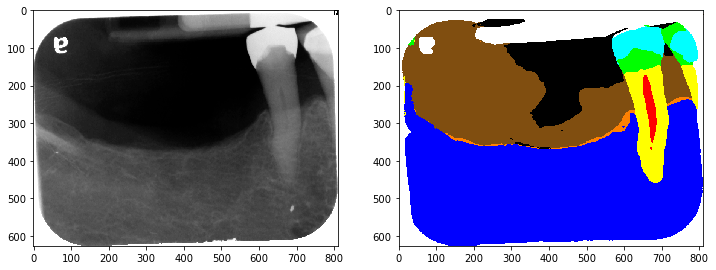

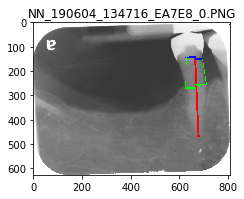

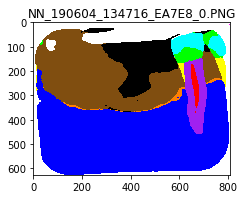

39 : NN_190911_161803_4C094
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 2934 | 31D          |       3 | 31_L                |      35.041 |           3 | NN_190911_161803_4C094_0.PNG |
| 2935 | 31M          |       3 | 31_R                |      29.427 |           2 | NN_190911_161803_4C094_0.PNG |
| 2936 | 30D          |       2 | 30_L                |      20.848 |           2 | NN_190911_161803_4C094_1.PNG |
| 2937 | 30M          |       2 | 30_R                |      22.856 |           2 | NN_190911_161803_4C094_1.PNG |
| 2938 | 29D          |       2 | 29_L                |      24.295 |           2 | NN_190911_161803_4C094_2.PNG |
| 2939 | 29M          |       2 | 29_R              

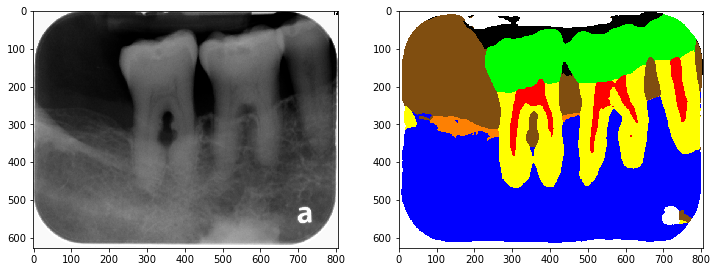

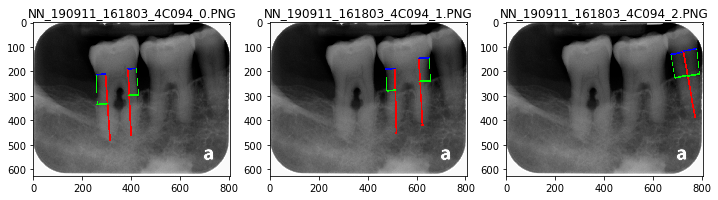

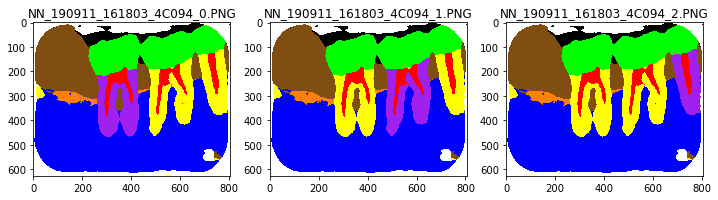

40 : NN__191111_145402_2420C
+-----+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|     | tooth_side   |   stage | PBL_predict_tooth   | PBL_value   | PBL_stage   | tooth_path                    |
|-----+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 434 | 29D          |       2 | 29_L                | -999.0      | -999        | NN__191111_145402_2420C_0.PNG |
| 435 | 29M          |       2 | 29_R                | 31.881      | 2           | NN__191111_145402_2420C_0.PNG |
| 436 | 28D          |       2 | 28_L                | -999.0      | -999        | NN__191111_145402_2420C_1.PNG |
| 437 | 28M          |       1 | 28_R                | 21.009      | 2           | NN__191111_145402_2420C_1.PNG |
| 438 | 27D          |       1 | No_match            | No_match    | No_match    | No_match                      |
+-----+--------------+---------+-------------------

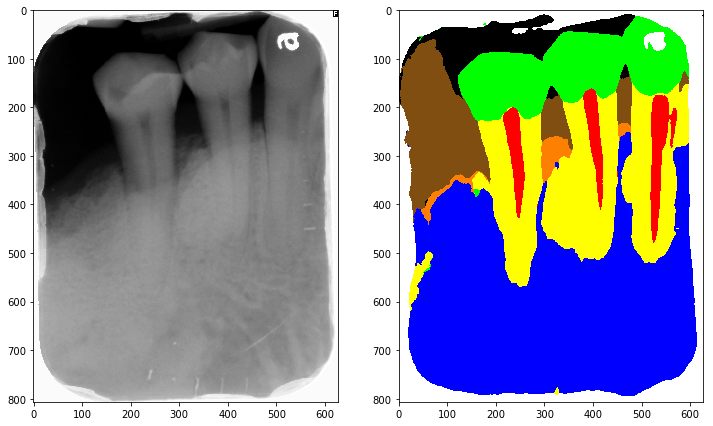

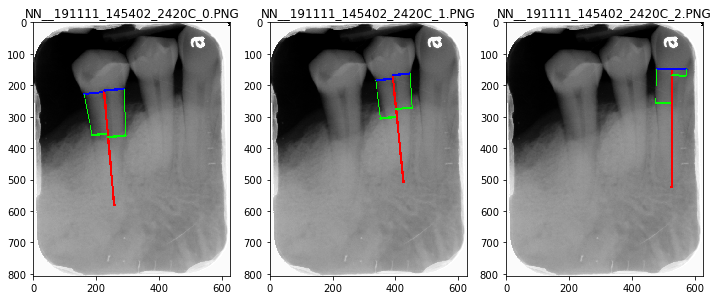

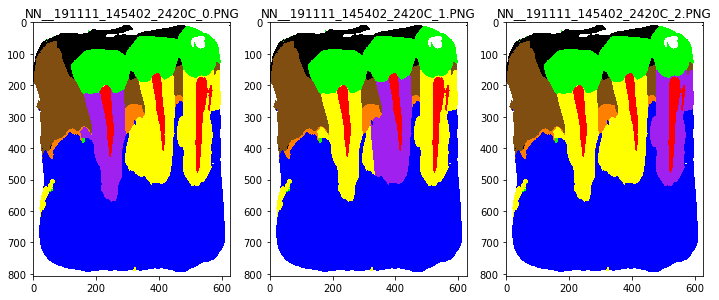

In [57]:
target_table_img_name = target_table['image_name']
target_name_list = list(set(list(target_table_img_name)))
target_name_list.sort()
print(len(target_name_list))
target_name_list = target_name_list[:]

#assert target_case['PBL_stage'] != 'No_match','Cannot be No_match'

if target_case['PBL_stage']!='No_match':
    for index,image_name in tqdm(enumerate(target_name_list),total=len(target_name_list)):
        print(index,":",image_name)
        Match_tooth_json = [json_path for json_path in json_file_list if image_name in json_path]
        target_o = [img_path for img_path in o_image_path_list if image_name in img_path]
        target_s = [img_path for img_path in s_image_path_list if image_name in img_path]
        target_info = [img_path for img_path in seg_image_info_path_list if image_name in img_path]
        target_pattern = [img_path for img_path in seg_fill_image_point_path_list if image_name in img_path]
        target_csv = show_csv.loc[(show_csv['image_name'] == image_name)]
        target_csv = target_csv[['tooth_side','stage','PBL_predict_tooth','PBL_value','PBL_stage','tooth_path']]
        print(tabulate(target_csv, headers='keys', tablefmt='psql'))
        
        if Match_tooth_json != []:
            tooth_in_json_list = []
            with open(Match_tooth_json[0], 'r') as file:
                json_file = json.load(file)
                for tooth in json_file['shapes']:
                    title = tooth['label']
                    tooth_in_json_list.append(title)
            print('Root in json:',tooth_in_json_list)
            
        if target_o != []:
            o_img = cv2.imread(target_o[0],0)
            s_img = cv2.imread(target_s[0])
            plt.figure(figsize=(12,12))
            plt.subplot(121)
            plt.imshow(o_img,cmap='gray')
            plt.subplot(122)
            plt.imshow(cv2.cvtColor(s_img,cv2.COLOR_BGR2RGB))
            plt.show()
        if target_info != []:
            count=0
            for img_path in target_info:
                if count == 0:
                    plt.figure(figsize=(12,12))
                count+=1
                info_img = cv2.imread(img_path)
                test_name = img_path.split('/')[-1]
                plt.subplot(1,3,count)
                plt.title('{}'.format(test_name.split('kkk')[0]))
                plt.imshow(cv2.cvtColor(info_img,cv2.COLOR_BGR2RGB))

                if count == 3:
                    plt.show()
                    count=0
            plt.show()
            
        if target_pattern != []:
            count=0
            for img_path in target_pattern:
                if count == 0:
                    plt.figure(figsize=(12,12))
                count+=1
                pattern_img = cv2.imread(img_path)
                test_name = img_path.split('/')[-1]
                plt.subplot(1,3,count)
                plt.title('{}'.format(test_name))
                plt.imshow(cv2.cvtColor(pattern_img,cv2.COLOR_BGR2RGB))

                if count == 3:
                    plt.show()
                    count=0
            plt.show()

In [58]:
# target_table_img_name = target_table['image_name']
# print(len(list(target_table_img_name)))
# target_name_list = list(set(list(target_table_img_name)))
# target_name_list.sort()
# print(len(target_name_list))
# target_name_list = target_name_list[:]

# #assert target_case['PBL_stage'] == 'No_match','Should be No_match'

# if target_case['PBL_stage']=='No_match':
#     for index,image_name in tqdm(enumerate(target_name_list),total=len(target_name_list)):
#         print('#################################################################################')
#         print(index,":",image_name)
#         Match_tooth_json = [json_path for json_path in json_file_list if image_name in json_path]
#         target_o = [img_path for img_path in o_image_path_list if image_name in img_path]
#         target_s = [img_path for img_path in s_image_path_list if image_name in img_path]
#         target_info = [img_path for img_path in seg_image_info_path_list if image_name in img_path]
#         target_csv = show_csv.loc[(show_csv['image_name'] == image_name)]
#         target_csv = target_csv[['tooth_num','state','PBL_predict_tooth','PBL_stage','tooth_path']]
#         print(tabulate(target_csv, headers='keys', tablefmt='psql'))

#         if Match_tooth_json != []:
#             tooth_in_json_list = []
#             with open(Match_tooth_json[0], 'r') as file:
#                 json_file = json.load(file)
#                 for tooth in json_file['shapes']:
#                     title = tooth['label']
#                     tooth_in_json_list.append(title)
#             print('Root in json:',tooth_in_json_list)
#         if target_o != []:
#             o_img = cv2.imread(target_o[0],0)
#             s_img = cv2.imread(target_s[0])
#             plt.figure(figsize=(12,12))
#             plt.subplot(121)
#             plt.imshow(o_img,cmap='gray')
#             plt.subplot(122)
#             plt.imshow(cv2.cvtColor(s_img,cv2.COLOR_BGR2RGB))
#             plt.show()
#         if target_info != []:
#             count=0
#             for img_path in target_info:
#                 if count == 0:
#                     plt.figure(figsize=(12,12))
#                 count+=1
#                 info_img = cv2.imread(img_path)
#                 test_name = img_path.split('/')[-1].split('kkk')[0]
#                 plt.subplot(1,3,count)
#                 plt.title('{}'.format(test_name))
#                 plt.imshow(cv2.cvtColor(info_img,cv2.COLOR_BGR2RGB))

#                 if count == 3:
#                     plt.show()
#                     count=0
#             plt.show()


In [59]:
seg_image_folder = '/root/notebooks/lawrence_compare_all/PBL_detection/1_seg_image'
seg_image_path_list = glob.glob(seg_image_folder+'/*.PNG')
seg_image_path_list.sort()
print(len(seg_image_path_list))

2511


In [53]:
# for img_path in tqdm(seg_image_path_list,total= len(seg_image_path_list)):
#     print(img_path)
#     plt.imshow(cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB))
#     plt.show()